# 1. Model Evaluation

In [1]:
import sys
sys.path.append("../dataset/")

import json
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from keras_unet_collection import losses


from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix
from skimage.measure import label, regionprops
import matplotlib.colors as mcolors

from utils import *

In [2]:
batch_size = 8
nfold = 4
fold_id = 0
image_shape = (320, 320, 1)
augment = False

train_samsung_gen, val_samsung_gen, test_samsung_gen = get_dataset('samsung', batch_size, image_shape, augment, nfold=nfold, fold_id=fold_id)
train_ge_gen, val_ge_gen, test_ge_gen = get_dataset('ge', batch_size, image_shape, augment, nfold=nfold, fold_id=fold_id)

Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading


In [3]:
train_mix_gen, val_mix_gen, test_mix_gen = get_dataset('mix', batch_size, image_shape, augment, nfold=nfold, fold_id=fold_id)

Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading


In [4]:
original_map = mcolors.LinearSegmentedColormap.from_list('original_mask', [(0, (0,0,0,0)), (1, 'yellow')])

In [5]:
samsung_images, samsung_masks = test_samsung_gen.__getitem__(0)

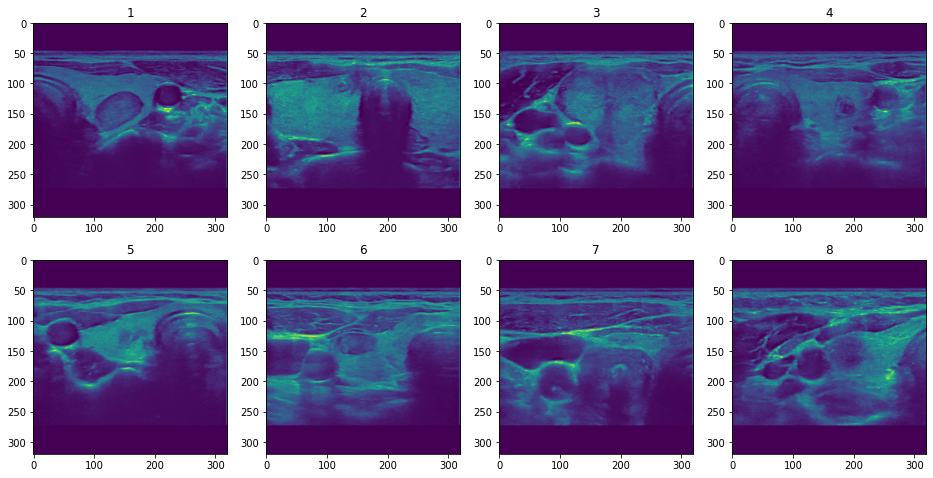

In [120]:
plt.figure(figsize=(16, 8))

i=1
for image, mask in zip(samsung_images, samsung_masks):
    plt.subplot(2, 4, i)
    plt.imshow(image)
    # plt.imshow(mask, alpha=0.5, cmap=original_map)
    plt.title(str(i))
    if i == 8:
        break
    i += 1
# plt.suptitle("Title centered above all subplots", fontsize=14)
plt.show()

In [5]:
ge_images, ge_masks = test_ge_gen.__getitem__(0)

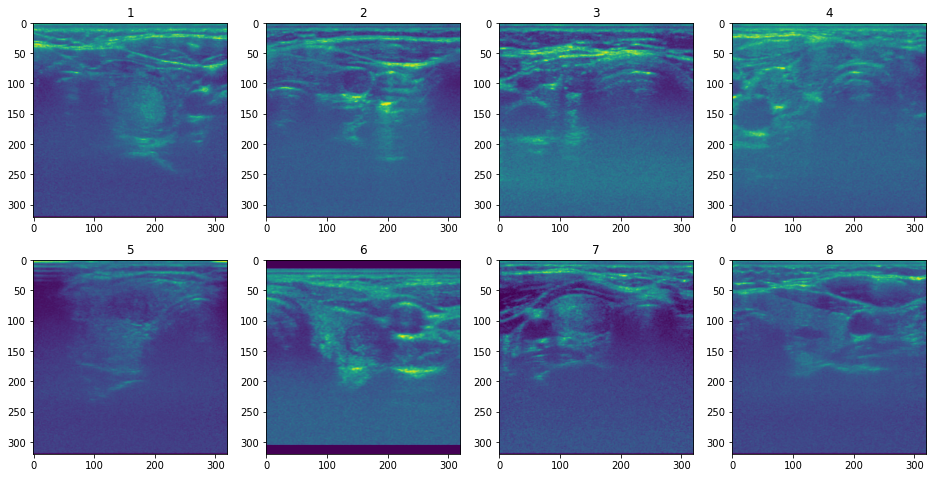

In [122]:
plt.figure(figsize=(16, 8))

i=1
for image, mask in zip(ge_images, ge_masks):
    plt.subplot(2, 4, i)
    plt.imshow(image)
    # plt.imshow(mask, alpha=0.5, cmap=original_map)
    plt.title(str(i))
    if i == 8:
        break
    i += 1

In [5]:
import tensorflow.keras.backend as K

def custom_focal_tversky(y_true, y_pred, alpha=0.7, gamma=4/3):
    return losses.focal_tversky(y_true, y_pred, alpha=alpha, gamma=gamma)

custom_objects = {'custom_focal_tversky': custom_focal_tversky}

class ModelTester:
    
    def __init__(self, path_to_model, 
                 custom_objects, 
                 # ds,
                 images, 
                 masks,
                 batch_id=0,
                 filter_masks=False, 
                 from_checkpoint=False):
        
        self.path_to_model = path_to_model
        self.custom_objects = custom_objects
        self.base_path = f'output/{path_to_model}'
        self.model_name = self.base_path.split('/')[1]
        self.model_type = self.base_path.split('/')[3]
        if from_checkpoint:
            self.model_path = f'{self.base_path}checkpoint'
        else:
            self.model_path = f'{self.base_path}model/model'
        self.meta_path = f'{self.base_path}meta/'

        self.original_map = mcolors.LinearSegmentedColormap.from_list('original_mask', [(0, (0,0,0,0)), (1, 'yellow')])
        self.pred_map = mcolors.LinearSegmentedColormap.from_list('pred_mask', [(0, (0,0,0,0)), (1, 'red')])
        self.images, self.masks = images, masks
        
        gpus = tf.config.list_logical_devices('GPU')
        strategy = tf.distribute.MirroredStrategy(gpus)
        with strategy.scope():
            self.model = tf.keras.models.load_model(self.model_path, custom_objects=self.custom_objects)
            self.predictions = self.model.predict(self.images) # Mock predictions
            
        # print(model.summary())
            
        if filter_masks:
            self.filtered_predictions = []
            for pred in self.predictions:
                self.filtered_predictions.append(np.array(self.get_largest_mask(pred)))
                                                 
    def create_report(self, model_summary=False, custom_objects=None, plot_history=True, rm_small_masks=False):
        model_path = f'{self.base_path}model/model'
        meta_path = f'{self.base_path}meta/'
        
        if plot_history:
            self.history = json.load(open(self.meta_path+'history.json'))
            self.plot_history()
        self.plot_us_images(rm_small_masks)
        
        dice_value = self.dice_coef(self.masks, self.predictions)
        print(f'Dice coefficient={dice_value}')
        
        accuracy, precision, recall, f1 = self.basic_metrics(self.masks, self.predictions)
        print(f'accuracy={accuracy}, precision={precision}, recall={recall}, f1={f1}')
        
        loss_val = custom_focal_tversky(self.masks, self.predictions)
        print(f'loss={loss_val}')

        y_true = np.round(self.masks).astype(int).flatten()
        y_pred = np.round(self.predictions).astype(int).flatten()
        cmat = confusion_matrix(y_true, y_pred)
        self.plot_confusion_matrix(cmat)
        
        if model_summary:
            print(model.summary())
    
    
    def plot_us_images(self, rm_small_masks=False):
        cols = 3 if rm_small_masks else 2
        
        image_id = 0
        plt.figure(figsize=(18, 10))
        for i in range(0, 4):
            plt.subplot(cols, 4, i+1)
            plt.imshow(self.images[i])
            plt.imshow(self.masks[i], alpha=0.3, cmap=self.original_map)
            plt.title('Oryginalna maska')
            
            plt.subplot(cols, 4, i+5)
            plt.imshow(self.images[i])
            plt.imshow(self.predictions[i], alpha=0.3, cmap=self.pred_map)
            plt.title('Przewidywana maska')
            
            if rm_small_masks:
                plt.subplot(cols, 4, i+9)
                plt.imshow(self.images[i])
                large_mask = self.get_largest_mask(self.predictions[i])
                plt.imshow(large_mask, alpha=0.5)
                plt.title('Predicted without small masks')
            image_id += 1
        plt.show()

    
    def plot_history(self):
        # Extract the history values
        loss = self.history['loss']
        acc = self.history['accuracy']
        val_loss = self.history['val_loss']
        val_acc = self.history['val_accuracy']
        # mean_io_u = self.history['mean_io_u']
        # val_mean_io_u = self.history['val_mean_io_u']
        
        plt.figure(figsize=(18, 15))
        plt.subplot(3, 1, 1)
        plt.plot(loss)
        plt.plot(val_loss)
        plt.title('Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend(['Training', 'Validation'])

        plt.subplot(3, 1, 2)
        plt.plot(acc)
        plt.plot(val_acc)
        plt.title('Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend(['Training', 'Validation'])
        
        plt.show()
    
        
    def dice_coef(self, y_true, y_pred, smooth=100):        
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)
        intersection = K.sum(y_true_f * y_pred_f)
        dice = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
        return dice
    
    
    def calculate_segmentation_metrics(self, y_true, y_pred):
        """
        Calculates TP, TN, FP, FN values for binary segmentation.
        """
        y_true = np.round(y_true).astype(int).flatten()
        y_pred = np.round(y_pred).astype(int).flatten()

        TP = np.sum((y_true == 1) & (y_pred == 1))
        TN = np.sum((y_true == 0) & (y_pred == 0))
        FP = np.sum((y_true == 0) & (y_pred == 1))
        FN = np.sum((y_true == 1) & (y_pred == 0))

        return TP, TN, FP, FN
    
    
    def basic_metrics(self, y_true, y_pred):
        TP, TN, FP, FN = self.calculate_segmentation_metrics(y_true, y_pred)
        
        accuracy = (TP + TN) / (TP + TN + FP + FN)
        precision = TP / (TP + FP)
        recall = TP / (TP + FN)
        f1 = 2 * precision * recall / (precision + recall)
        
        return accuracy, precision, recall, f1


    def plot_confusion_matrix(self, cmat):
        plt.figure(figsize = (6,6))
        labels = ['0', '1']
        annot = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
        group_counts = ['{0:0.0f}'.format(value) for value in cmat.flatten()]
        annot = [f'{v1}\n{v2}' for v1, v2 in zip(annot, group_counts)]
        annot = np.asarray(annot).reshape(2,2)
        sns.heatmap(cmat, cmap='Blues', fmt='', xticklabels=labels, yticklabels=labels, annot=annot)

        plt.xlabel("predictions")
        plt.ylabel("real values")
        plt.show()
        
        
    def class_histogram(self):
        pass
    
        
    def mean_iou(self):
        
        return None
        

    def get_largest_mask(self, segmentation_output):
        labeled_output = label(segmentation_output)
        props = regionprops(labeled_output)
        largest_mask_index = np.argmax([prop.area for prop in props])
        largest_mask = labeled_output == (largest_mask_index + 1)
        return largest_mask
    
    
    @staticmethod
    def calculate_full_metrics():
        pass
        
# u2net_2d_tester = ModelTester('unet_2d/samsung/test/', val_gen, custom_objects)
# u2net_2d_tester.create_report(rm_small_masks=True)

## 1. Classic U-Net

For rerun 
Samsung
'unet_2d/samsung/320_nf4_fi3/'

GE
'unet_2d/ge/320_nf4_fi2/'

## 1.1. Samsung on Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


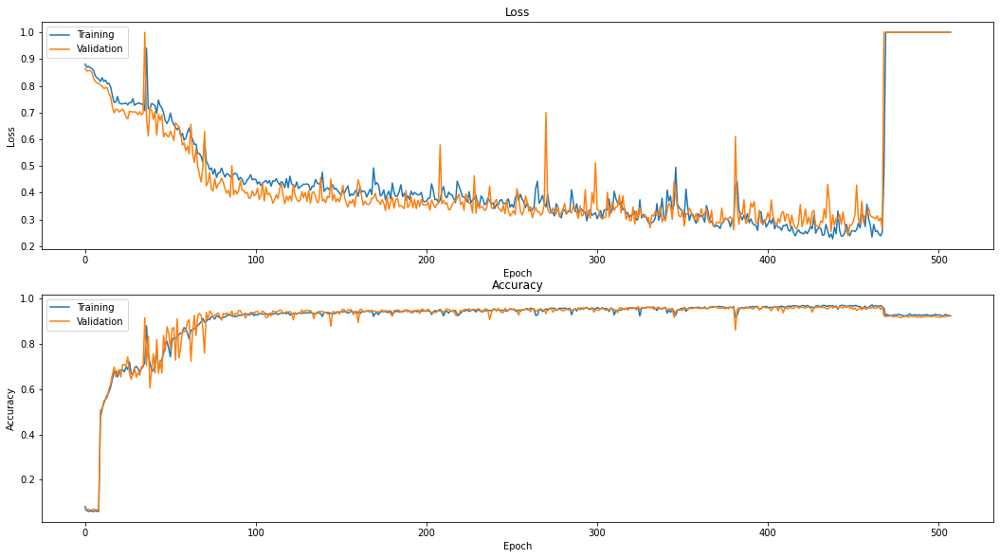

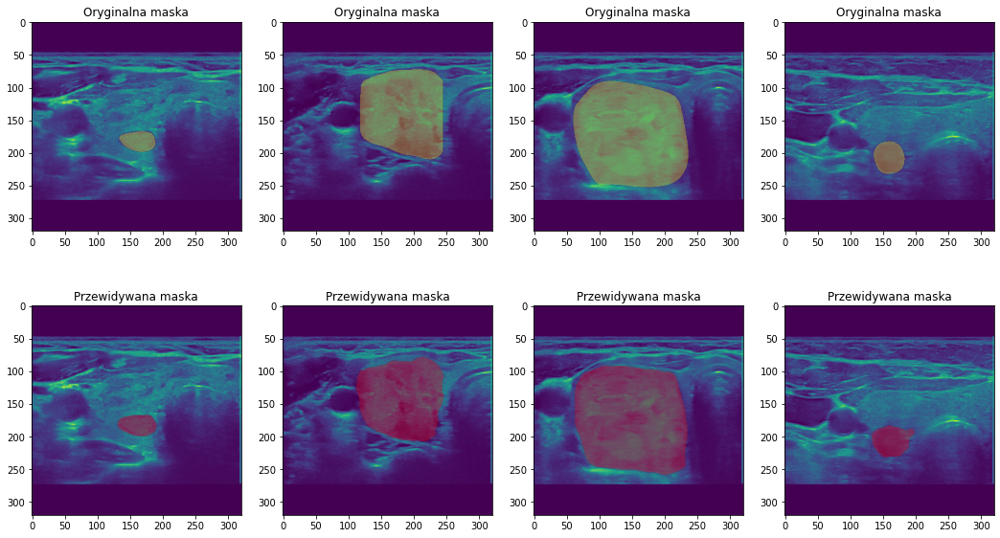

Dice coefficient=0.8680596947669983
accuracy=0.97763427734375, precision=0.8391287360812659, recall=0.8985059016883311, f1=0.8678028225922826
loss=0.20392586290836334


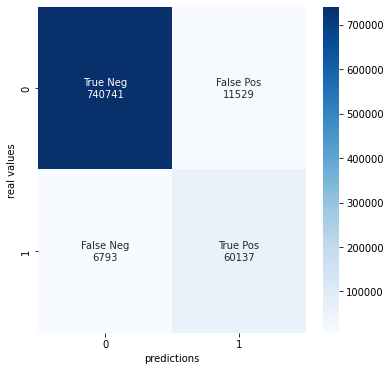

In [7]:
u2net_2d_tester = ModelTester('unet_2d/samsung/320_nf4_fi3/', custom_objects, samsung_images, samsung_masks)
u2net_2d_tester.create_report(plot_history=True)

## 1.2. GE on GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


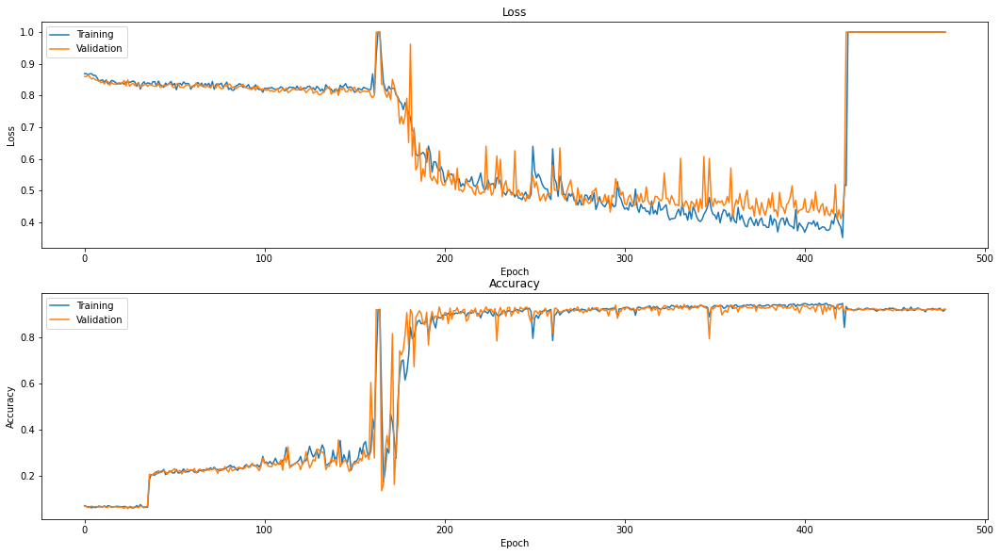

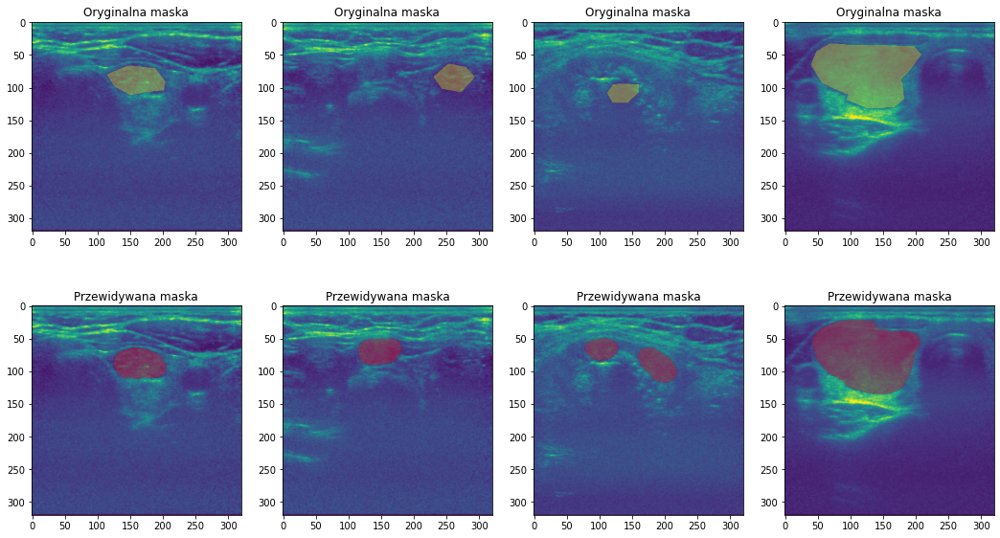

Dice coefficient=0.6949803829193115
accuracy=0.967244873046875, precision=0.5880118030510502, recall=0.8478587319243605, f1=0.6944232499345185
loss=0.3548142611980438


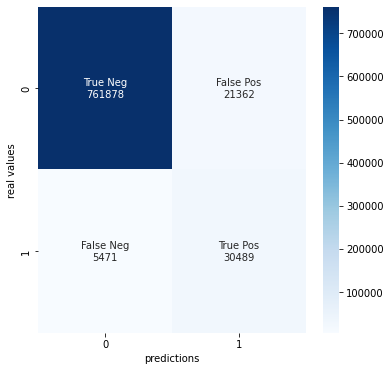

In [11]:
unet_2d_tester = ModelTester('unet_2d/ge/320_nf4_fi2/', custom_objects, ge_images, ge_masks)
unet_2d_tester.create_report(plot_history=True)

## 1.3. Samsung on GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


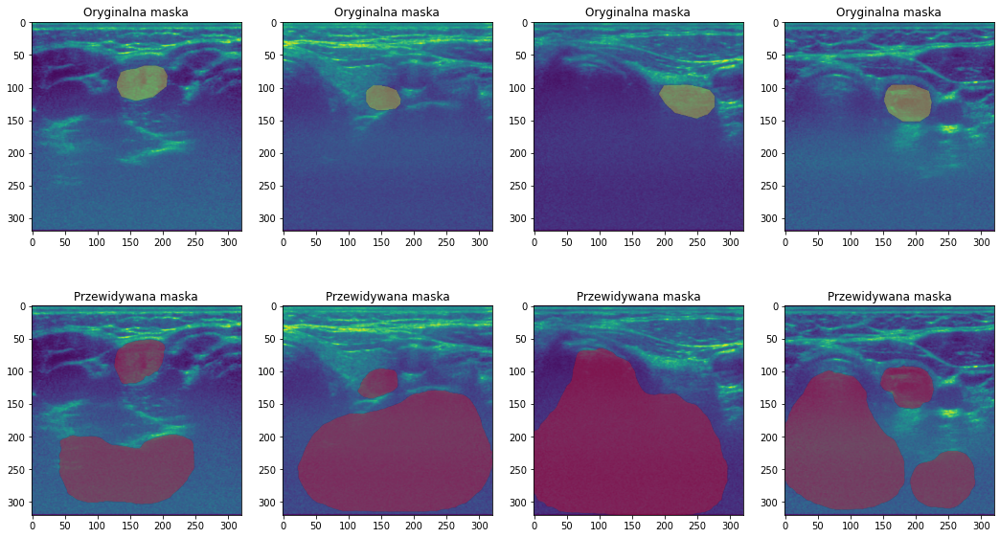

Dice coefficient=0.11393407732248306
accuracy=0.6583203125, precision=0.061414343242882606, recall=0.762953202703277, f1=0.11367810414054286
loss=0.8677613139152527


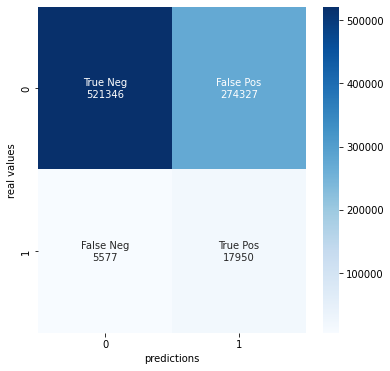

In [36]:
unet_2d_tester = ModelTester('unet_2d/samsung/320_nf4_fi0/', custom_objects, ge_images, ge_masks)
unet_2d_tester.create_report(plot_history=False)

## 1.4. GE on Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


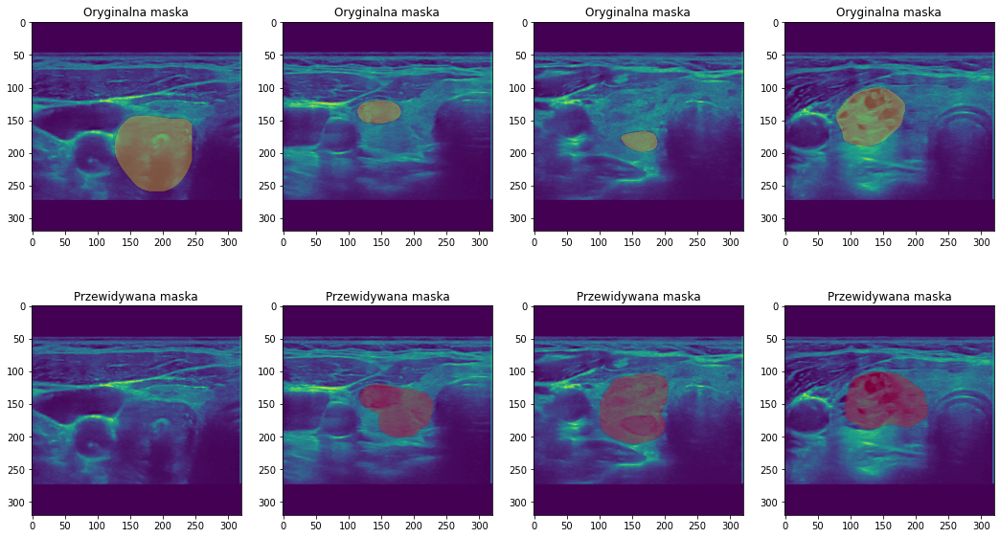

Dice coefficient=0.5466128587722778
accuracy=0.94544921875, precision=0.5793330890436057, recall=0.5163787969029184, f1=0.546047418784665
loss=0.5640836358070374


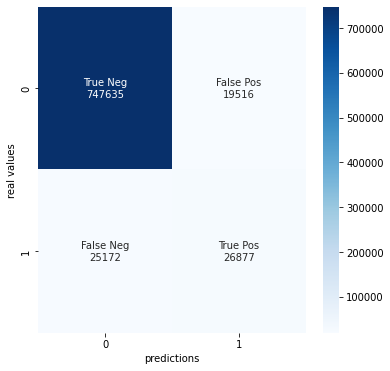

In [37]:
unet_2d_tester = ModelTester('unet_2d/ge/320_nf4_fi0/', custom_objects, samsung_images, samsung_masks)
unet_2d_tester.create_report(plot_history=False)

## 5.5. Mix on Samsung

Retrain 
All

Trained on stack_num_down=4, stack_num_up=4 instead of stack_num_down=3, stack_num_up=3
'unet_2d/mix/320_nf4_fi0/'
'unet_2d/mix/320_nf4_fi3/'

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localho

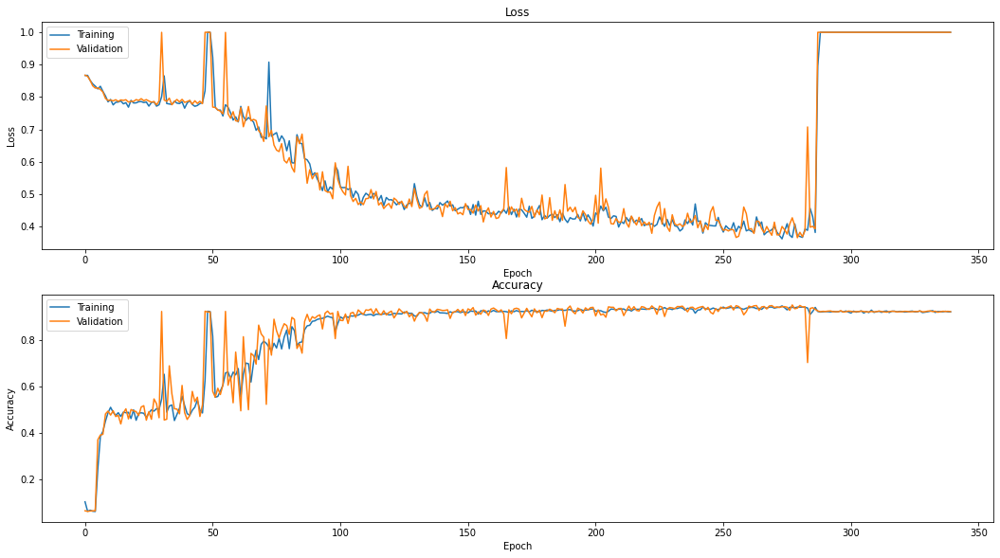

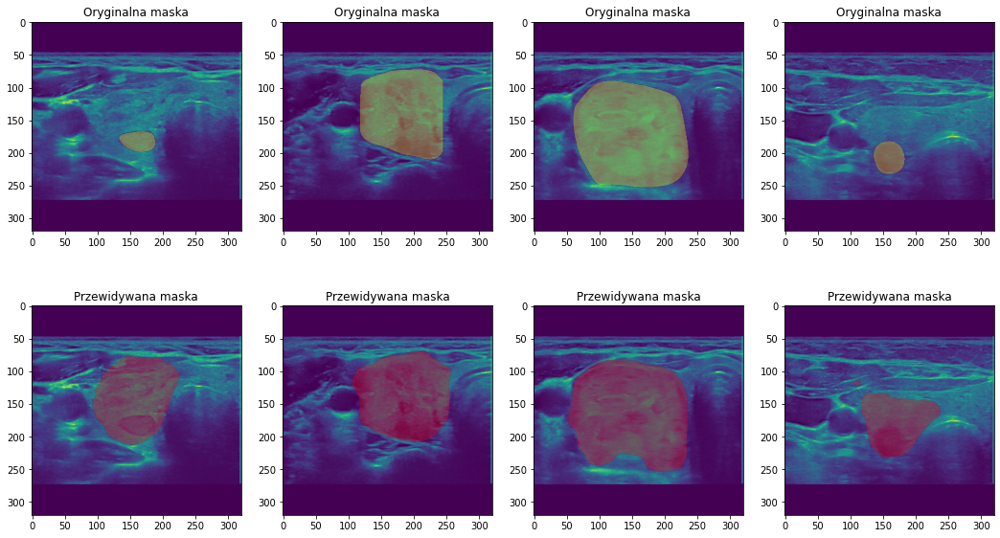

Dice coefficient=0.719916582107544
accuracy=0.93884765625, precision=0.575365770670296, recall=0.9600776931122068, f1=0.7195261236647034
loss=0.2991807758808136


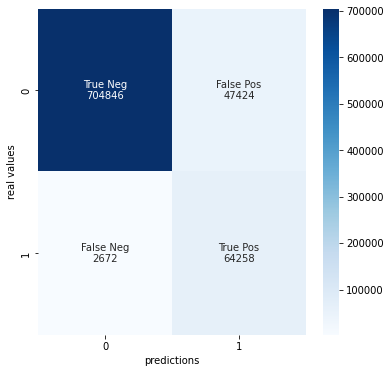

In [7]:
unet_2d_tester = ModelTester('unet_2d/mix/320_nf4_fi0/', custom_objects, samsung_images, samsung_masks)
unet_2d_tester.create_report(plot_history=True)

## 5.5. Mix on GE

# 2. U^2-Net

## 2.1. Samsung

For rerun 
Samsung


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


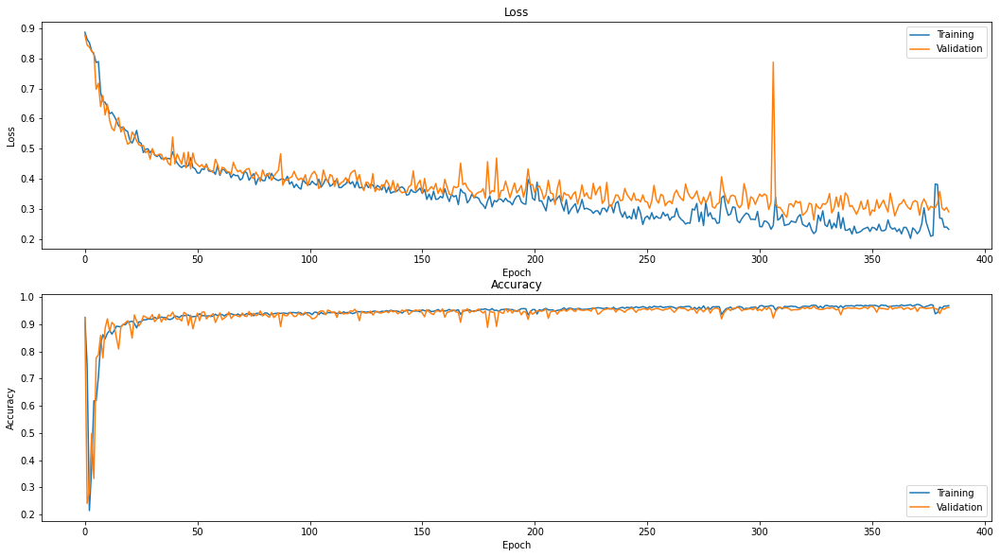

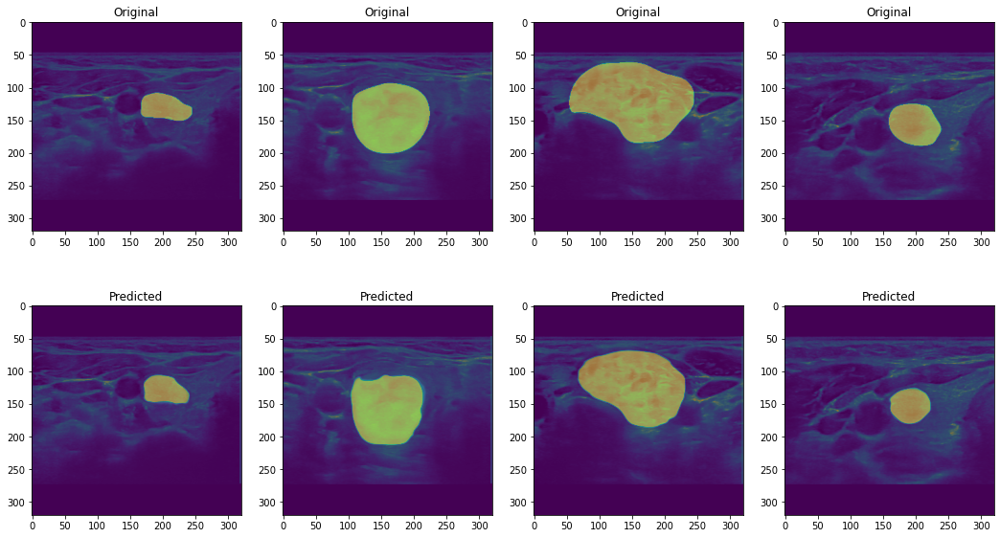

Dice coefficient=0.864187479019165
accuracy=0.982620849609375, precision=0.913004679939716, recall=0.823764112289993, f1=0.8660916675288518
loss=0.24412938952445984


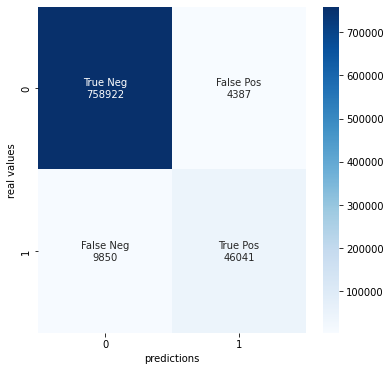

In [5]:
u2net_2d_tester = ModelTester('u2net_2d/samsung/320_nf4_fi0/', custom_objects, ds=test_samsung_gen, size=(320, 320))
u2net_2d_tester.create_report(plot_history=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


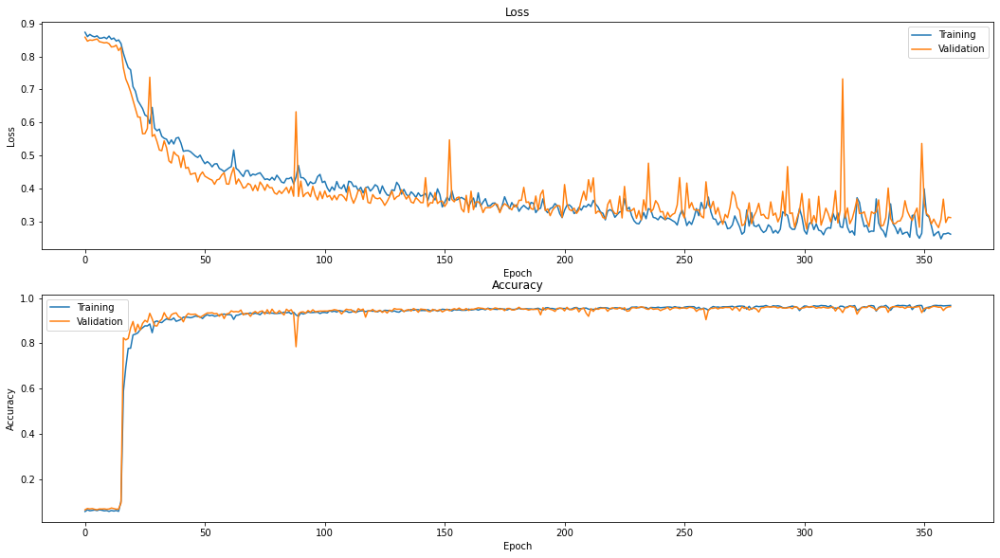

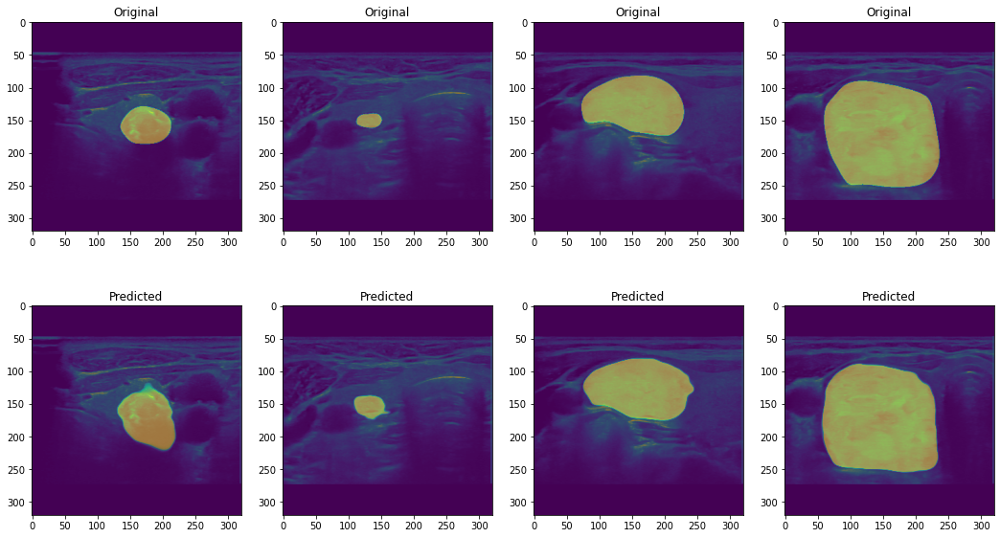

Dice coefficient=0.8476685881614685
accuracy=0.975244140625, precision=0.7784213850847367, recall=0.9385380713950059, f1=0.8510138113429327
loss=0.20272256433963776


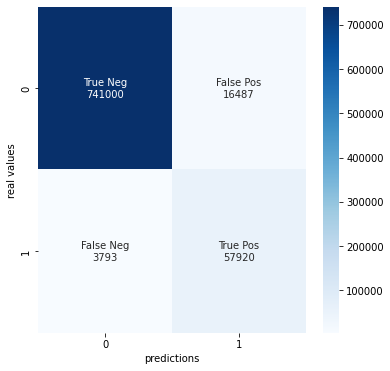

In [6]:
u2net_2d_tester = ModelTester('u2net_2d/samsung/320_nf4_fi3/', custom_objects, ds=test_samsung_gen, size=(320, 320))
u2net_2d_tester.create_report(plot_history=True)

## 2.2 GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


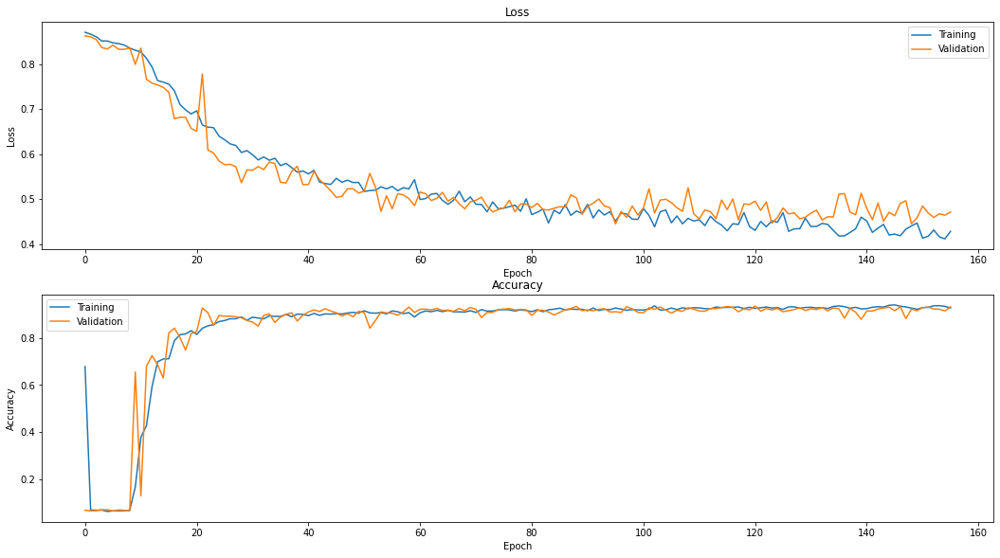

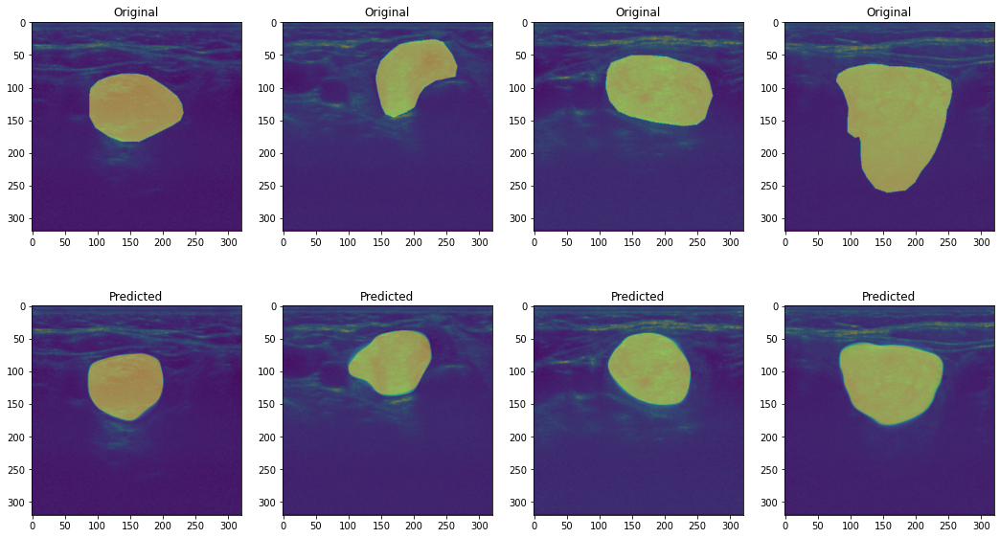

Dice coefficient=0.6172356605529785
accuracy=0.911033935546875, precision=0.7578125997726779, recall=0.5239369216641944, f1=0.6195375837209424
loss=0.5250241756439209


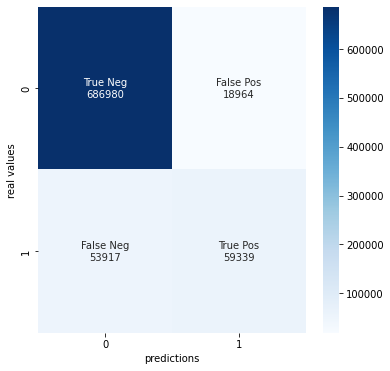

In [27]:
u2net_2d_tester = ModelTester('u2net_2d/ge/320_nf4_fi2/', custom_objects, ds=test_ge_gen, size=(320, 320), batch_id=1)
u2net_2d_tester.create_report(plot_history=True)

## 2.3. Samsung on GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


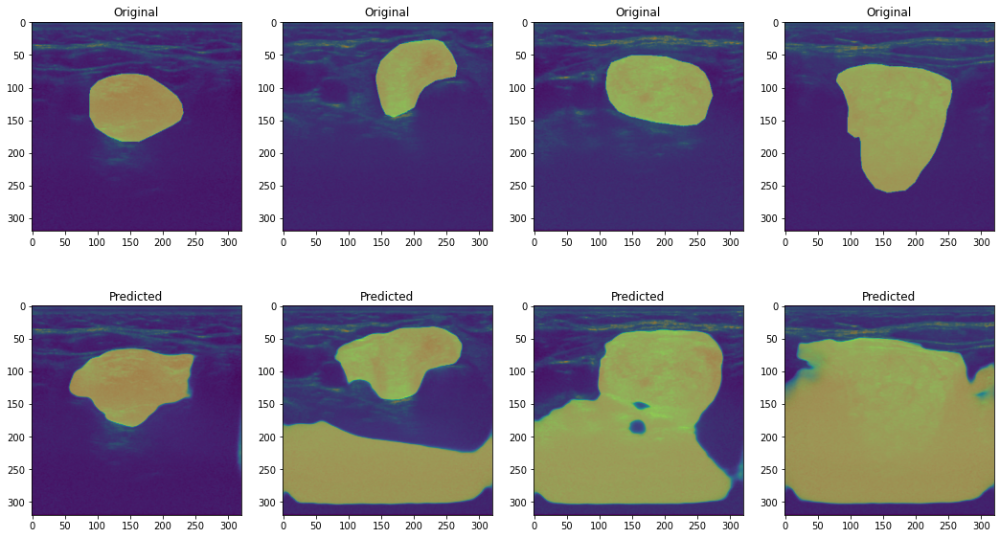

Dice coefficient=0.3906748294830322
accuracy=0.605242919921875, precision=0.24764432488260654, recall=0.9103535353535354, f1=0.3893683993874518
loss=0.5890365242958069


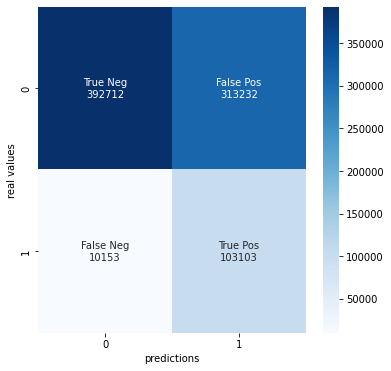

In [28]:
u2net_2d_tester = ModelTester('u2net_2d/samsung/320_nf4_fi1/', custom_objects, ds=test_ge_gen, size=(320, 320), batch_id=1)
u2net_2d_tester.create_report(plot_history=False)

## 2.4. GE on Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


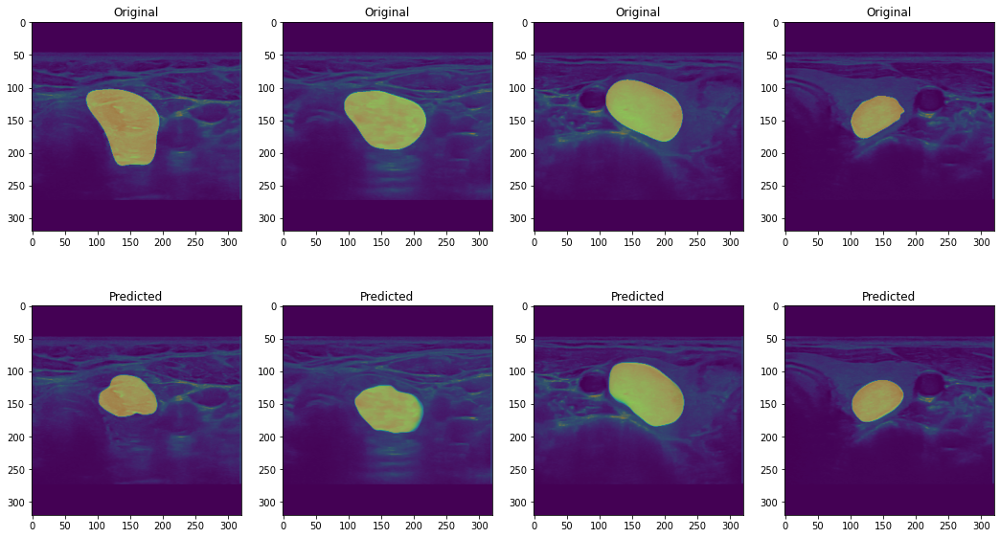

Dice coefficient=0.780373215675354
accuracy=0.97041259765625, precision=0.7482614507368741, recall=0.8253177313700241, f1=0.7849029143445387
loss=0.30533477663993835


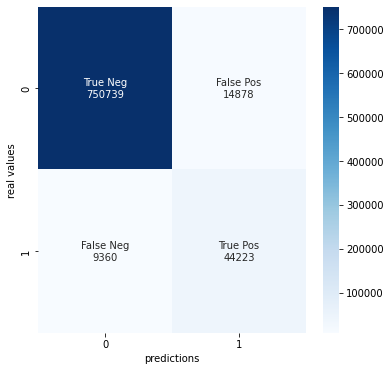

In [15]:
u2net_2d_tester = ModelTester('u2net_2d/ge/320_nf4_fi2/', custom_objects, ds=test_samsung_gen, size=(320, 320))
u2net_2d_tester.create_report(plot_history=False)

## 2.5. Mix on Samsung

Retrain 

!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
Retrained with stack_num_down=4, stack_num_up=4
!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'u2net_2d/mix/320_nf4_fi0/'
'u2net_2d/mix/320_nf4_fi3/'

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


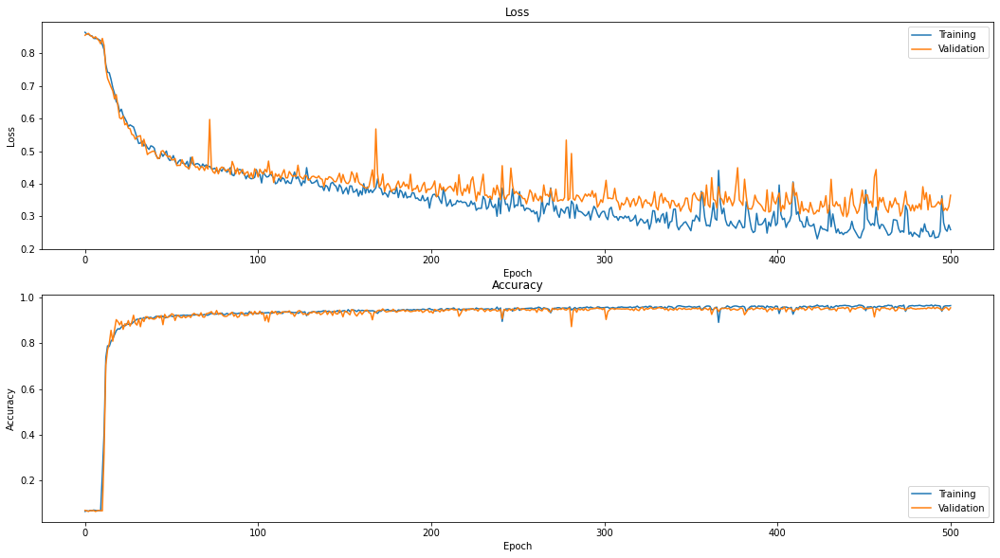

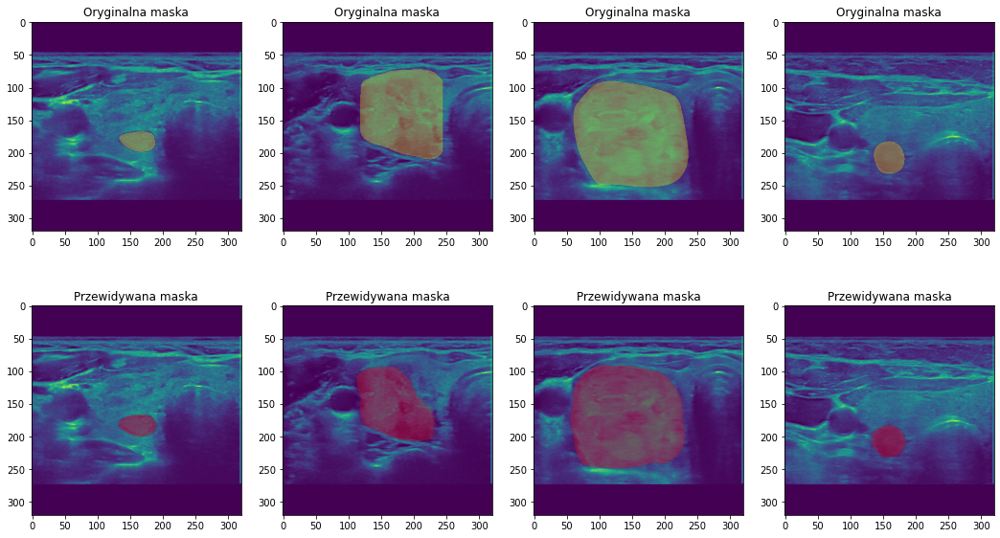

Dice coefficient=0.7622494697570801
accuracy=0.96321533203125, precision=0.802220908075432, recall=0.7296578514866279, f1=0.7642207721077259
loss=0.3564944863319397


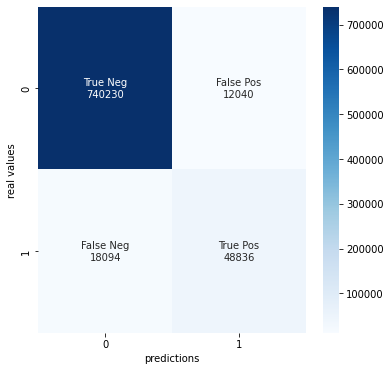

In [11]:
u2net_2d_tester = ModelTester('u2net_2d/mix/320_nf4_fi3/', custom_objects, samsung_images, samsung_masks)
u2net_2d_tester.create_report(plot_history=True)

# 3. Unet-3D+

For rerun

Samsung



## 3.1. Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


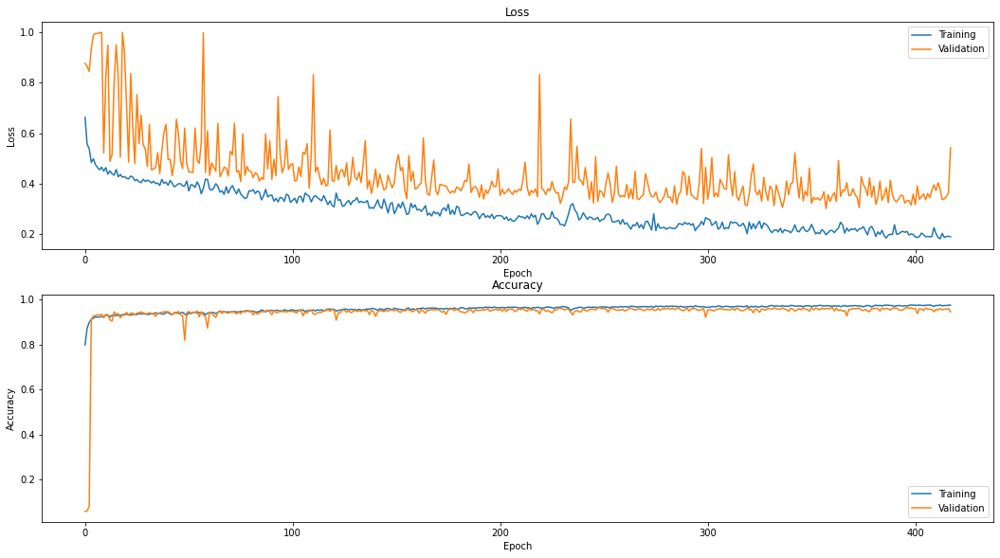

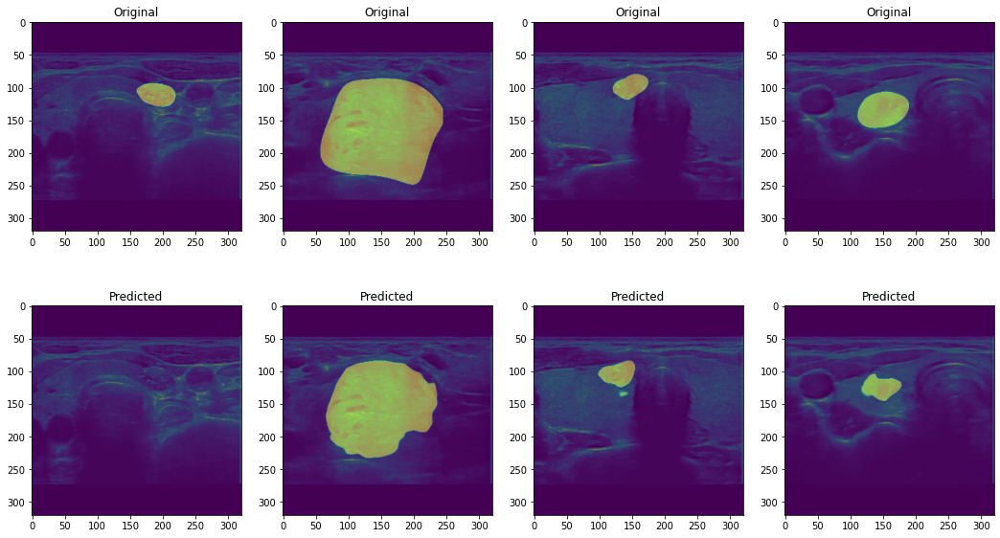

Dice coefficient=0.6439123153686523
accuracy=0.96372802734375, precision=0.7504122069138977, recall=0.5637031594415871, f1=0.6437939053921216
loss=0.4945428669452667


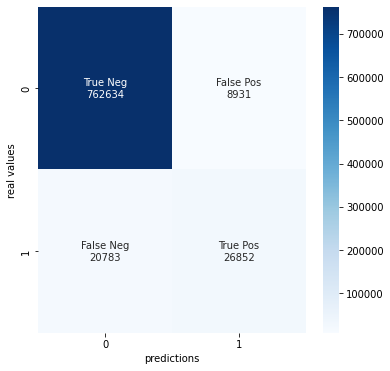

In [7]:
unet_3plus_2d_tester = ModelTester('unet_3plus_2d/samsung/320_nf4_fi1/', custom_objects=custom_objects, ds=test_samsung_gen, batch_id=1)
unet_3plus_2d_tester.create_report(plot_history=True)

## 3.2. GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


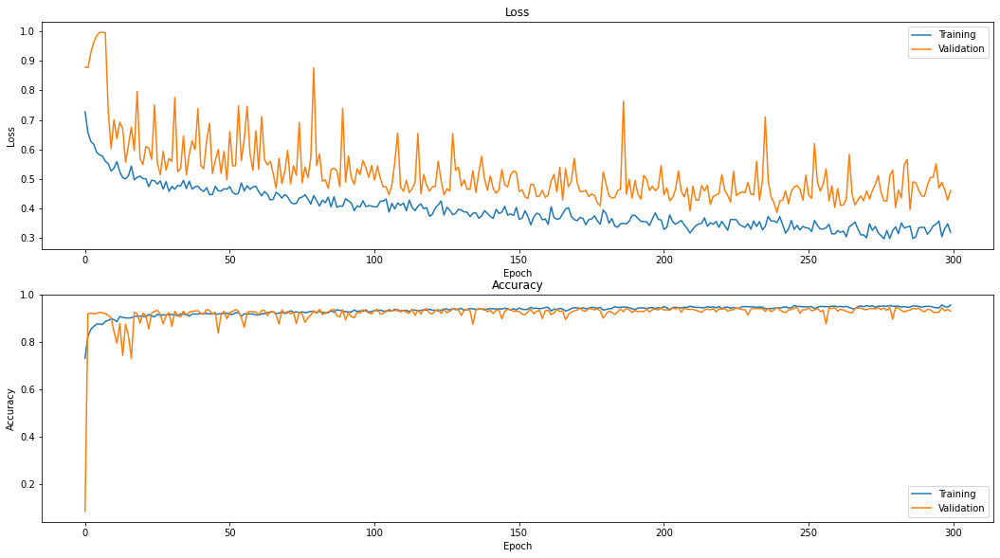

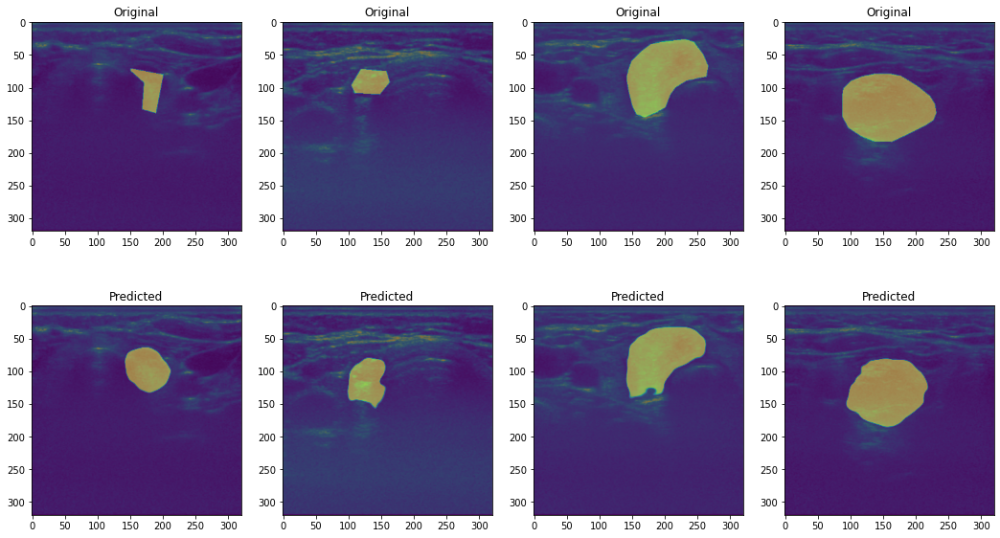

Dice coefficient=0.8474569320678711
accuracy=0.972708740234375, precision=0.840134395491248, recall=0.8545246592897794, f1=0.847268429645924
loss=0.24080750346183777


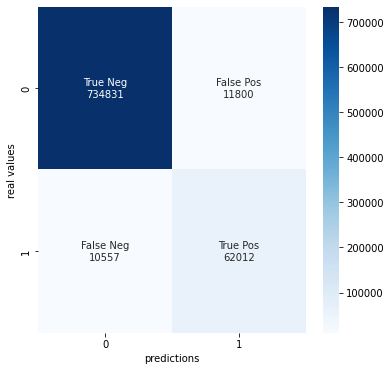

In [7]:
unet_3plus_2d_tester = ModelTester('unet_3plus_2d/ge/320_nf4_fi3/', custom_objects=custom_objects, ds=test_ge_gen, batch_id=1)
unet_3plus_2d_tester.create_report(plot_history=True)

## 3.3. Samsung on GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


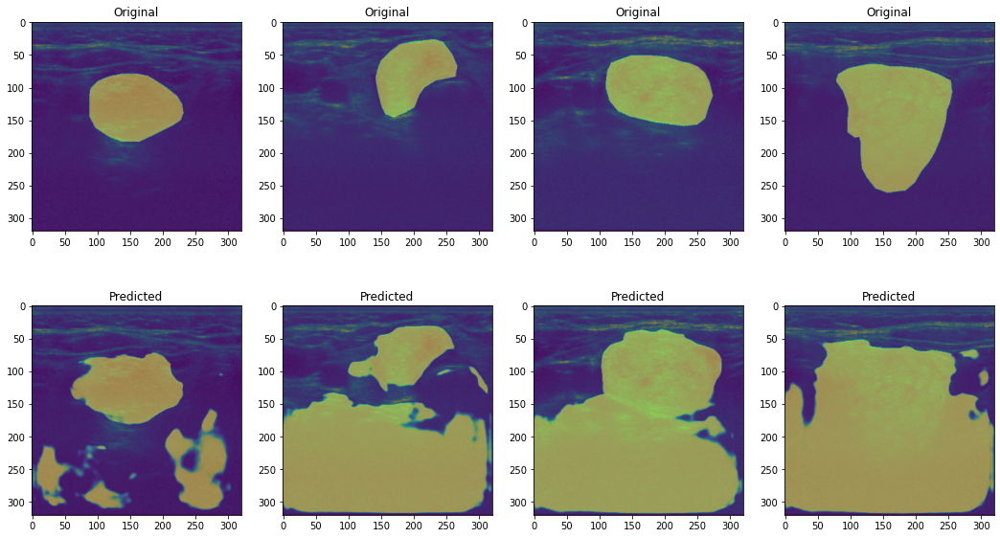

Dice coefficient=0.34440407156944275
accuracy=0.572071533203125, precision=0.2185278230484012, recall=0.8133608815426997, f1=0.34449835918436034
loss=0.6409668922424316


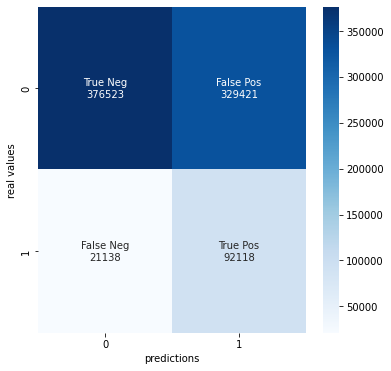

In [36]:
unet_3plus_2d_tester = ModelTester('unet_3plus_2d/samsung/320_nf4_fi0/', custom_objects=custom_objects, ds=test_ge_gen, batch_id=1)
unet_3plus_2d_tester.create_report(plot_history=False)

## 3.4. GE on Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


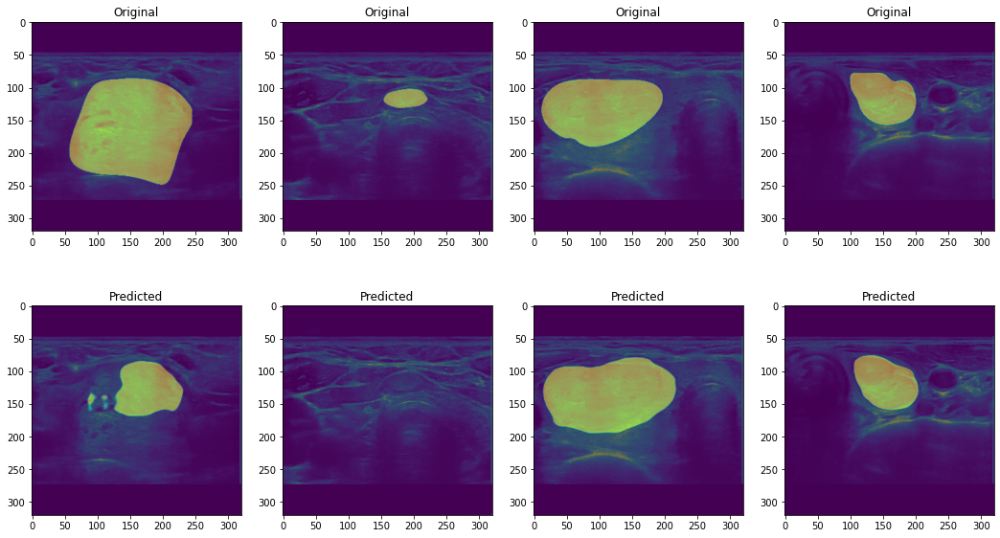

Dice coefficient=0.6187209486961365
accuracy=0.945159912109375, precision=0.6041919653996507, recall=0.6321973125391631, f1=0.6178774656153513
loss=0.4801424741744995


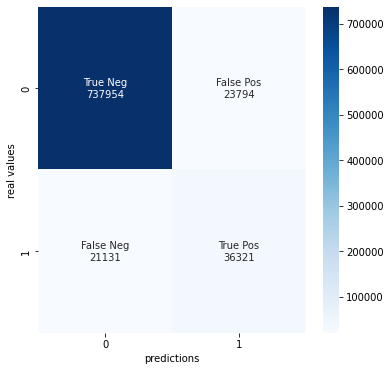

In [39]:
unet_3plus_2d_tester = ModelTester('unet_3plus_2d/ge/320_nf4_fi0/', custom_objects=custom_objects, ds=test_samsung_gen, batch_id=1)
unet_3plus_2d_tester.create_report(plot_history=False)

## Mix

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


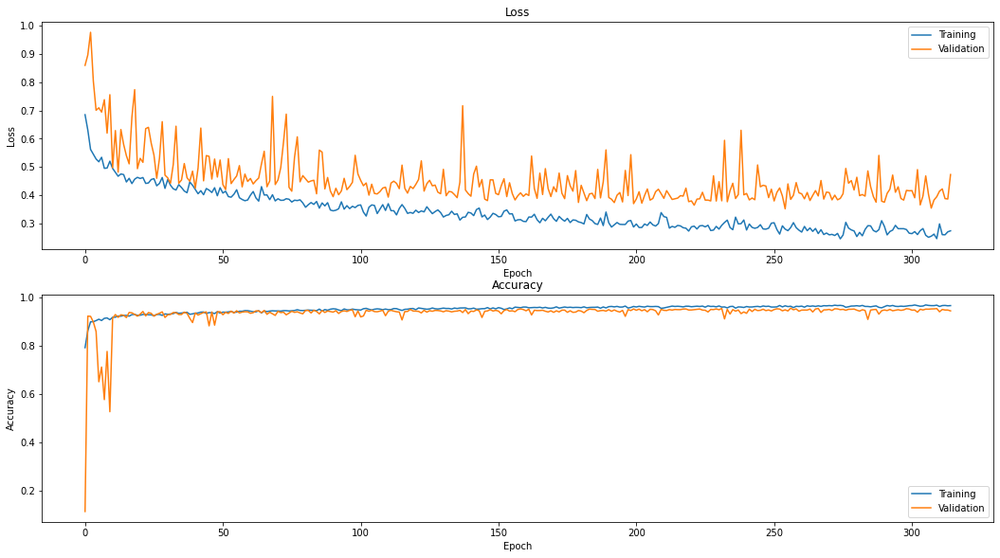

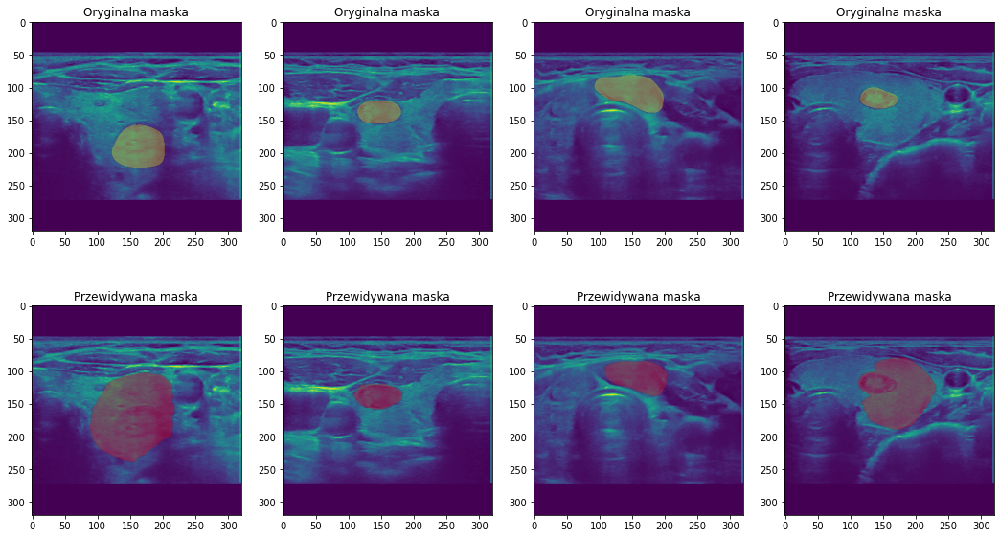

Dice coefficient=0.6516767144203186
accuracy=0.9642138671875, precision=0.49045076680521715, recall=0.9690265486725663, f1=0.6512739990007851
loss=0.3540329337120056


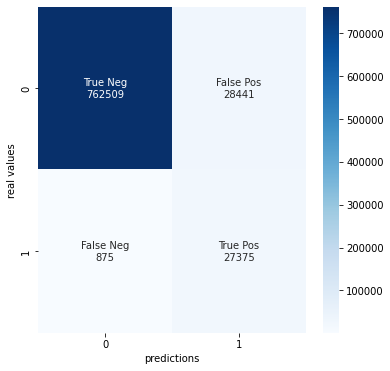

In [17]:
unet_3plus_2d_tester = ModelTester('unet_3plus_2d/mix/320_nf4_fi1/', custom_objects, samsung_images, samsung_masks)
unet_3plus_2d_tester.create_report(plot_history=True)

# 4. Transunet

For rerun

'transunet_2d/samsung/320_nf4_fi1/'

## 4.1. Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


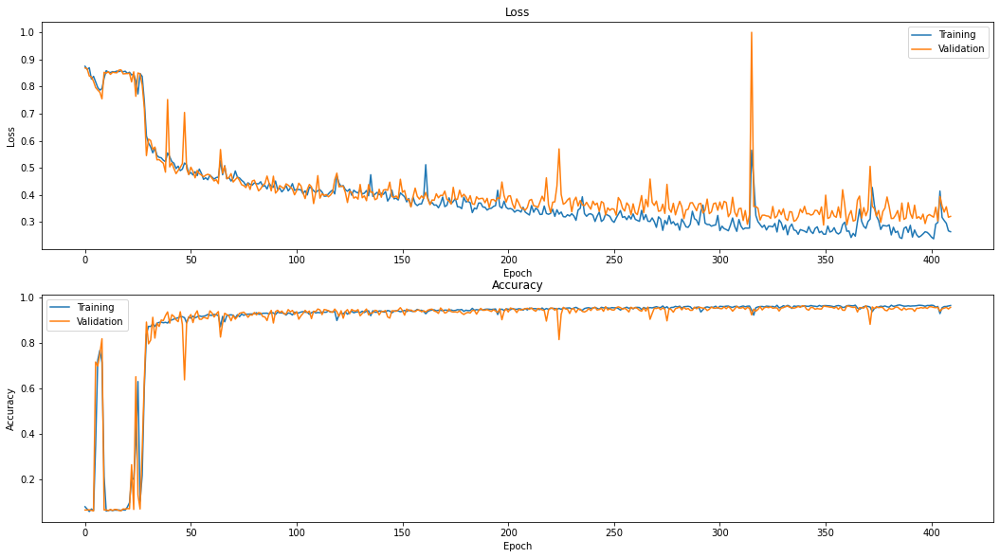

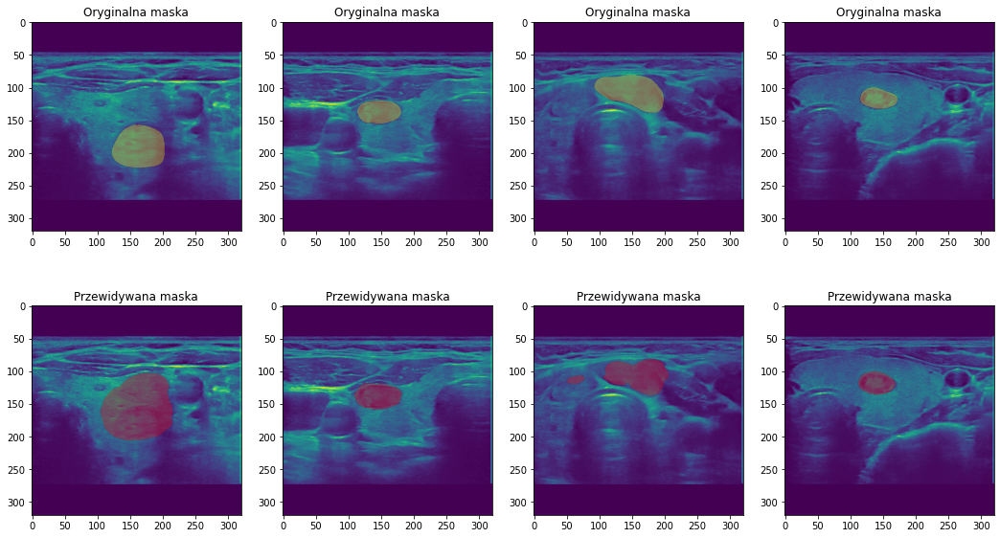

Dice coefficient=0.827840268611908
accuracy=0.9782820129394532, precision=0.7967899739098024, recall=0.8612665966666918, f1=0.827774638411564
loss=0.25191575288772583


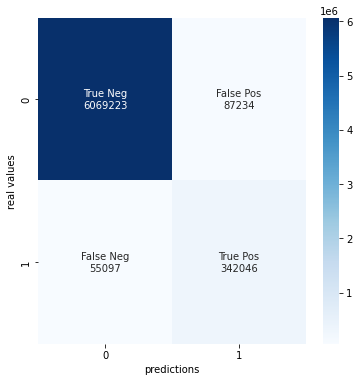

In [29]:
transunet_2d_tester = ModelTester('transunet_2d/samsung/320_nf4_fi0/', custom_objects, samsung_images, samsung_masks)
transunet_2d_tester.create_report(plot_history=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


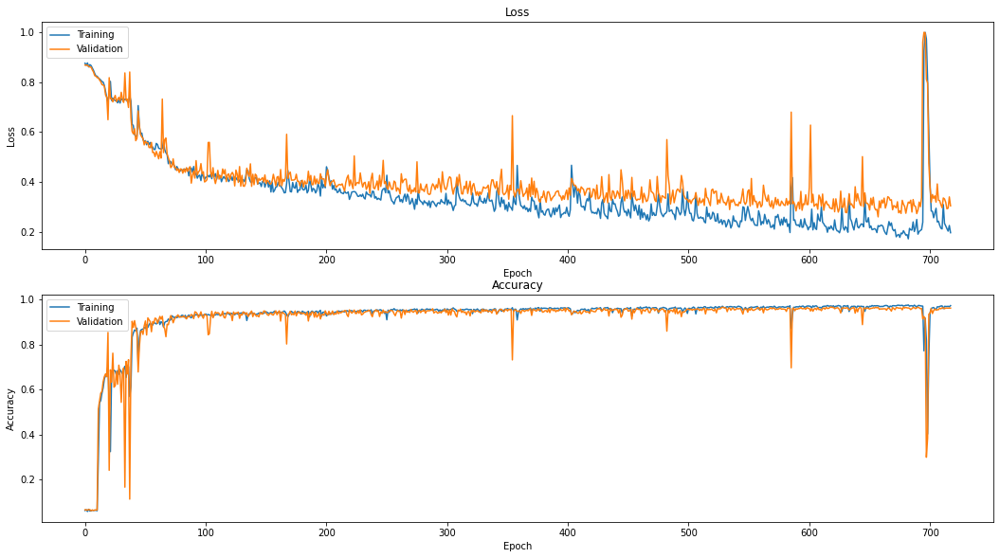

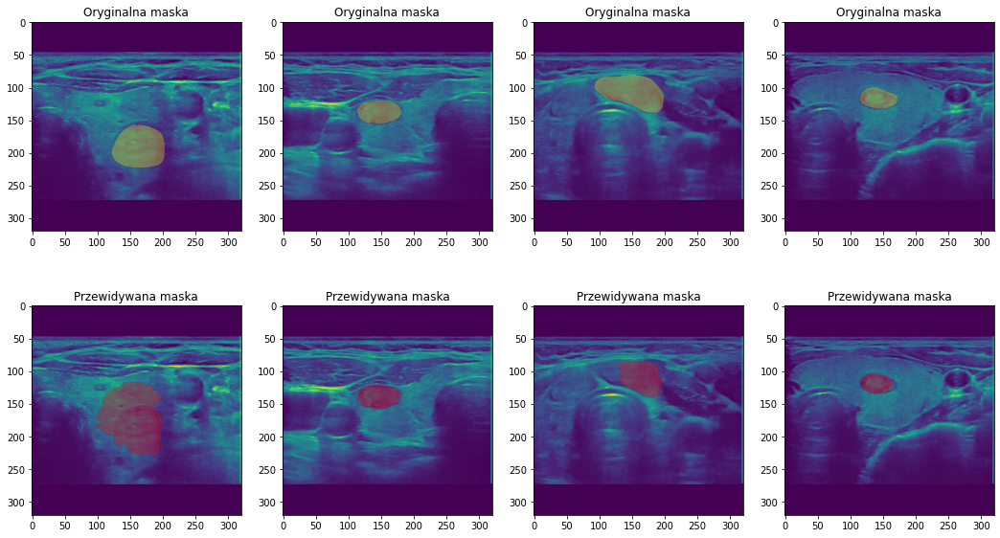

Dice coefficient=0.8332201838493347
accuracy=0.979171142578125, precision=0.8093630638265548, recall=0.8584942955056492, f1=0.8332050332724824
loss=0.2492772340774536


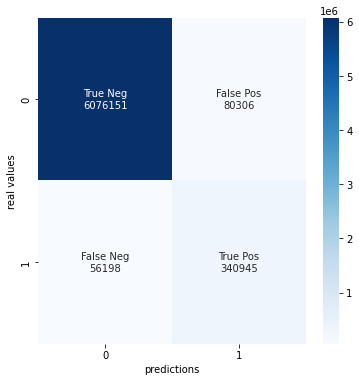

In [30]:
transunet_2d_tester = ModelTester('transunet_2d/samsung/test_arch_2/', custom_objects, samsung_images, samsung_masks)
transunet_2d_tester.create_report(plot_history=True)

## 4.2. GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


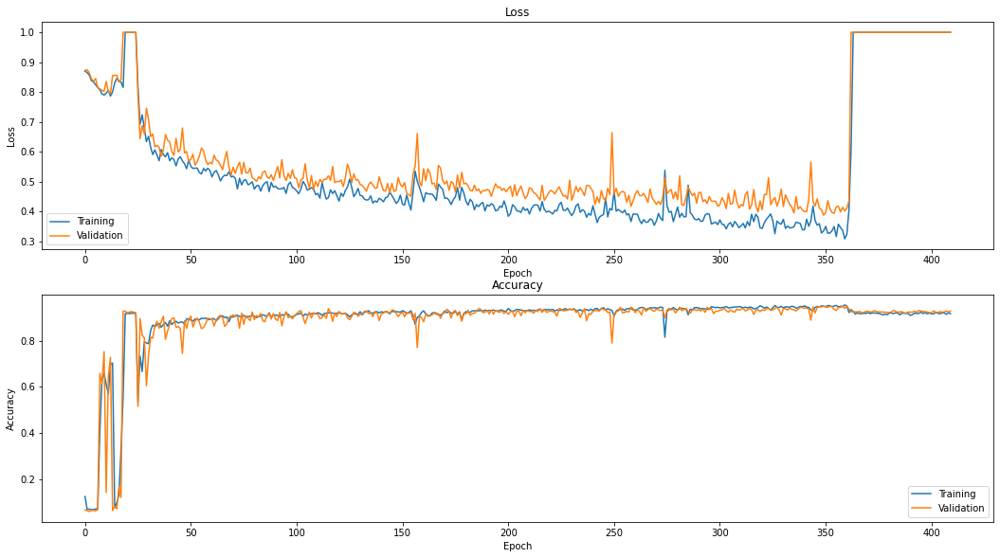

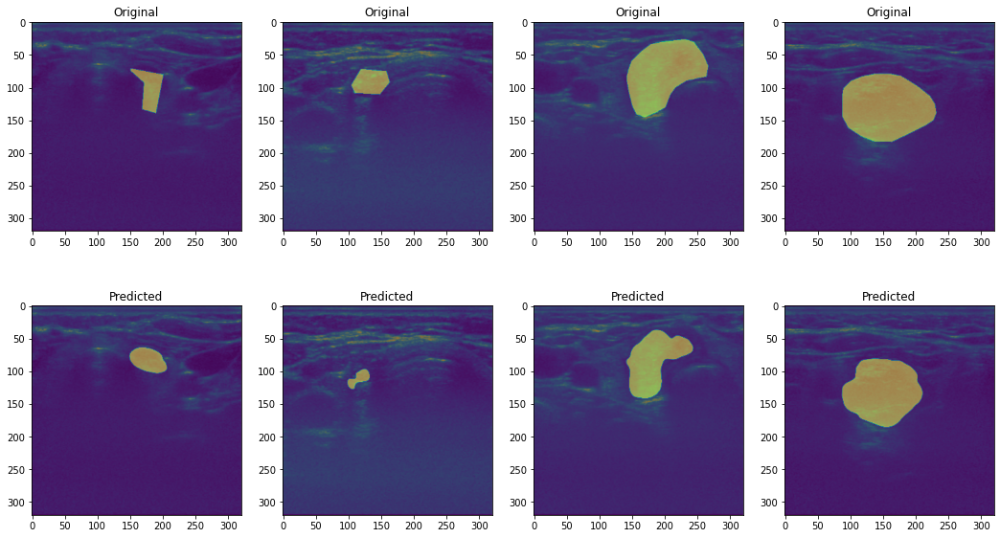

Dice coefficient=0.8399377465248108
accuracy=0.971876220703125, precision=0.8466739459096254, recall=0.8334550565668536, f1=0.8400124995659872
loss=0.2563346028327942


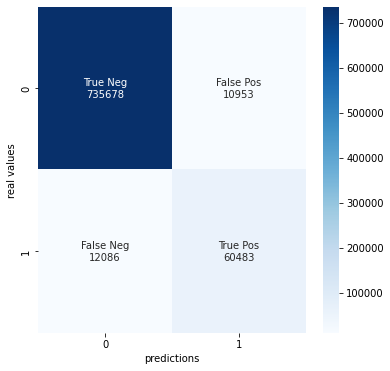

In [9]:
transunet_2d_tester = ModelTester('transunet_2d/ge/320_nf4_fi3/', custom_objects=custom_objects, ds=test_ge_gen, batch_id=1)
transunet_2d_tester.create_report(plot_history=True)

## 4.3. Samsung on GE

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


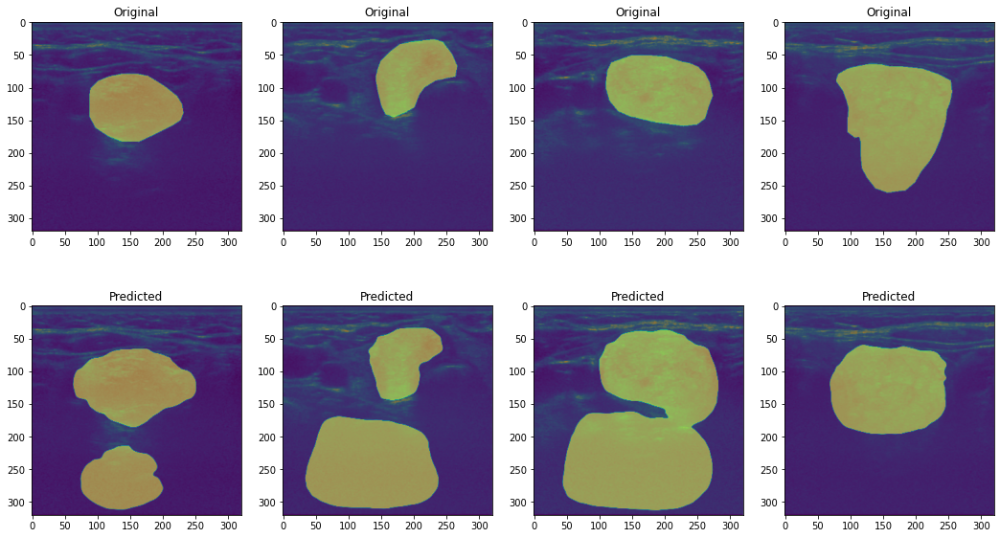

Dice coefficient=0.4845745861530304
accuracy=0.780294189453125, precision=0.35855671763912855, recall=0.7467683831320195, f1=0.48448880805419114
loss=0.5368759036064148


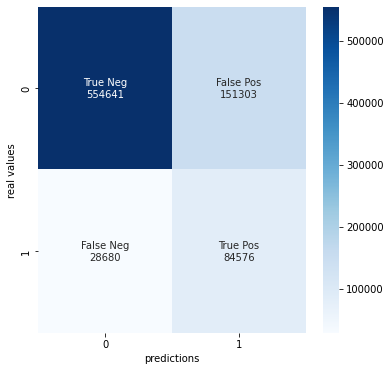

In [42]:
transunet_2d_tester = ModelTester('transunet_2d/samsung/320_nf4_fi0/', custom_objects=custom_objects, ds=test_ge_gen, batch_id=1)
transunet_2d_tester.create_report(plot_history=False)

## 4.4 GE on Samsung

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')


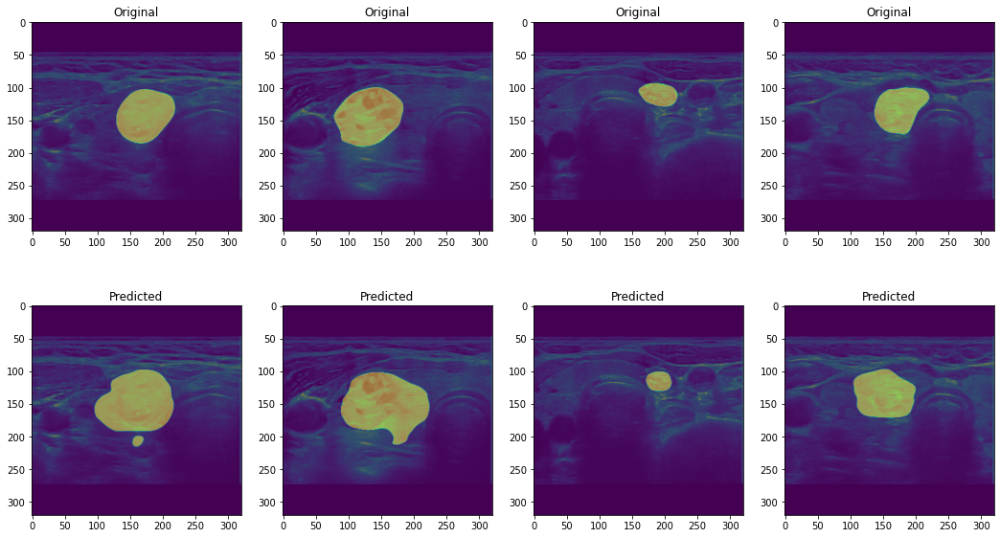

Dice coefficient=0.6104358434677124
accuracy=0.944107666015625, precision=0.4605149828381905, recall=0.9036171930178589, f1=0.6101010789130823
loss=0.4041687846183777


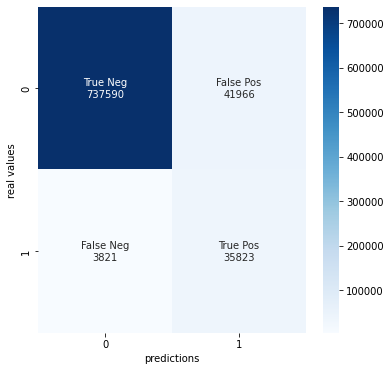

In [45]:
transunet_2d_tester = ModelTester('transunet_2d/ge/320_nf4_fi1/', custom_objects=custom_objects, ds=test_samsung_gen, batch_id=0)
transunet_2d_tester.create_report(plot_history=False)

## 4.5. Mix on Samsung

Retrain all

'transunet_2d/mix/320_nf4_fi2/'

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localho

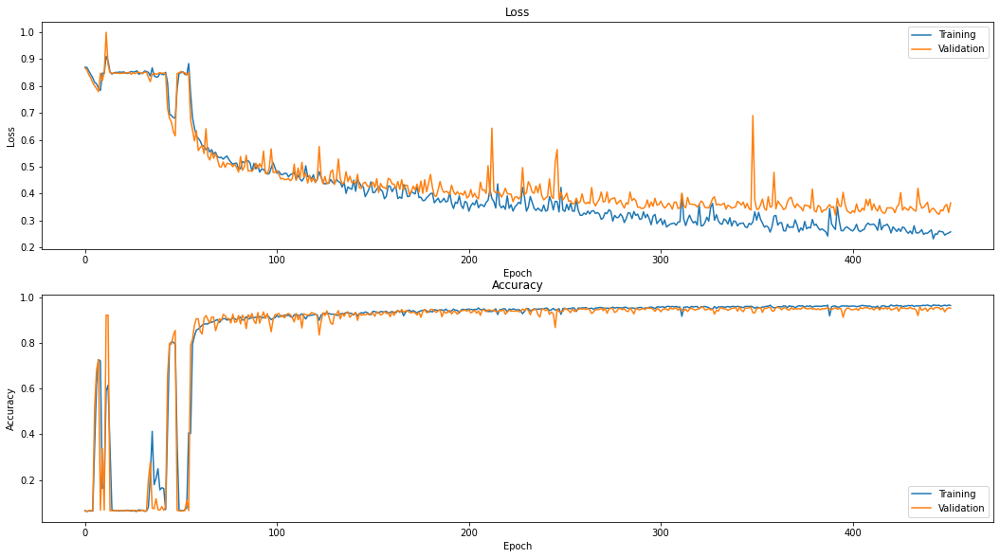

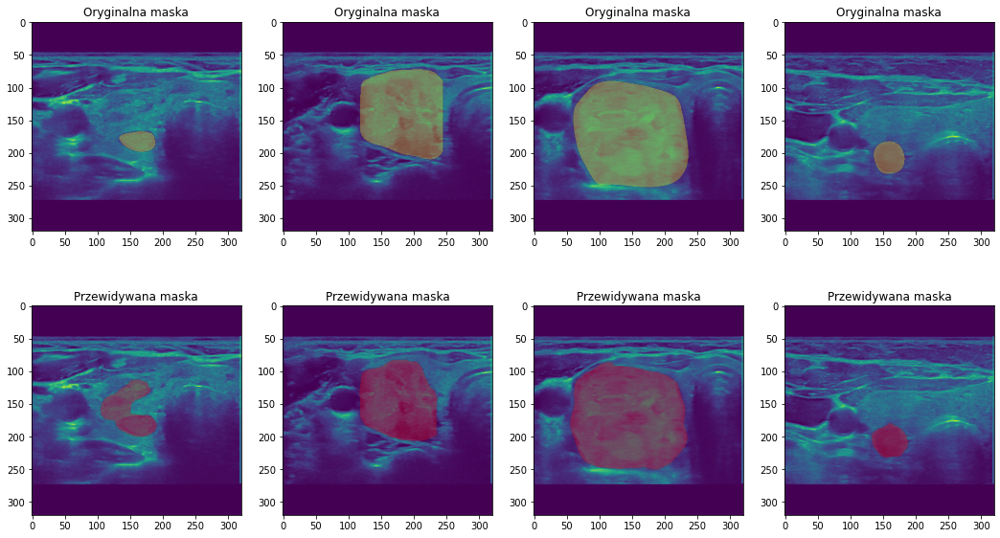

Dice coefficient=0.8459200859069824
accuracy=0.973375244140625, precision=0.8036803209175226, recall=0.892021515015688, f1=0.8455497567573308
loss=0.22421154379844666


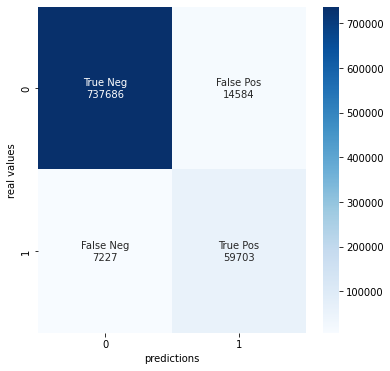

In [7]:
transunet_2d_tester = ModelTester('transunet_2d/mix/320_nf4_fi2/', custom_objects, samsung_images, samsung_masks)
transunet_2d_tester.create_report(plot_history=True)

# 5. Compare metrics

In [6]:
import sklearn.metrics as metrics
from IPython.display import clear_output
from tabulate import tabulate
import math

In [7]:
def plot_roc(output, masks):
    # input_image = np.expand_dims(image, 0)
    labels = []
    plt.figure(figsize=(15, 15))
    plt.plot([0, 1], [0, 1])
    labels.append('baseline')
    # plt.plot([0, 0], [0, 1], color='black')
    for key, value in output.items():
        fpr, tpr, threshold = metrics.roc_curve(np.round(masks).astype(int).flatten(), value['prediction'].flatten())
        # fpr, tpr, threshold = metrics.roc_curve(np.round(images).astype(int), value['prediction'])
        roc_auc = metrics.auc(fpr, tpr)
        plt.plot(fpr,tpr,label="AUC="+str(roc_auc))
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        labels.append(f'{key}, auc={round(roc_auc,3)}')
    plt.grid()
    plt.legend(labels)
    plt.show()
            
        
def dice_coef(y_true, y_pred, smooth=100):        
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    dice = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return dice


def calculate_segmentation_metrics(y_true, y_pred):
    """
    Calculates TP, TN, FP, FN values for binary segmentation.
    """
    # Convert to numpy arrays of int type
    # y_true = np.array(y_true, dtype=int).flatten()
    # y_pred = np.array(y_pred, dtype=int).flatten()

    y_true = np.round(y_true).astype(int).flatten()
    y_pred = np.round(y_pred).astype(int).flatten()

    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    FP = np.sum((y_true == 0) & (y_pred == 1))
    FN = np.sum((y_true == 1) & (y_pred == 0))

    return TP, TN, FP, FN


def basic_metrics(y_true, y_pred):
    TP, TN, FP, FN = calculate_segmentation_metrics(y_true, y_pred)

    accuracy = (TP + TN) / (TP + TN + FP + FN)
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    f1 = 2 * precision * recall / (precision + recall)

    return accuracy, precision, recall, f1

def get_average_accuracy(y_true, y_pred):
    TP, TN, FP, FN = calculate_segmentation_metrics(y_true, y_pred)
    acc1 = TP / (TP + FP)
    acc2 = TN / (TN + FN)
    return (acc1 + acc2) / 2


def make_predictions(model_name, model_paths, images, masks):
    
    gpus = tf.config.list_logical_devices('GPU')
    strategy = tf.distribute.MirroredStrategy(gpus)

    losses = []
    dice_coefs = []
    accuracies = []
    precisions = []
    recalls = []
    f1s = []
    roc_aucs = []
    cohen_kappa_scores = []
    matthews_corrcoefs = []
    avg_accuracies = []
    ious = []
    
    predictions_output = {}
    
    for i, m_path in enumerate(model_paths):
        name = m_path.split('/')[0]
        title = ' '.join(name.split('_')[:-1]).capitalize()

        print('loading model: ', name)
        with strategy.scope():
            model = tf.keras.models.load_model(f'output/{m_path}model/model', custom_objects=custom_objects)
            
            for idx in range(8):
                start_index = idx*8
                end_index = start_index + 8
                sub_pred = model.predict(images[start_index:end_index])
                if idx == 0:
                    predictions = sub_pred
                else:
                    predictions = np.concatenate((predictions, sub_pred), axis=0)
                    
            predictions_output['fold_'+str(i)] = predictions
            
            loss = custom_focal_tversky(masks, predictions)
            accuracy, precision, recall, f1 = basic_metrics(masks, predictions)
            avg_accuracy_value = get_average_accuracy(masks, predictions)
            fpr, tpr, threshold = metrics.roc_curve(np.round(masks).astype(int).flatten(), predictions.flatten())
            roc_auc = metrics.auc(fpr, tpr)
            iou = metrics.jaccard_score(np.round(masks).astype(int).flatten(), np.round(predictions).astype(int).flatten())
            
            losses.append(loss)
            accuracies.append(accuracy)
            precisions.append(precision)
            recalls.append(recall)
            f1s.append(f1)
            roc_aucs.append(roc_auc)
            avg_accuracies.append(avg_accuracy_value)
            ious.append(iou)
            
    n_folds = len(losses)
            
    avg_loss = np.mean(losses)
    std_loss = np.std(losses) / math.sqrt(n_folds)

    avg_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies) / math.sqrt(n_folds)

    avg_precision = np.mean(precisions)
    std_precisions = np.std(precisions) / math.sqrt(n_folds)

    avg_recalls = np.mean(recalls)
    std_recalls = np.std(recalls) / math.sqrt(n_folds)

    avg_f1 = np.mean(f1s)
    std_f1 = np.std(f1s) / math.sqrt(n_folds)

    avg_roc_auc = np.mean(roc_aucs)
    std_roc_auc = np.std(roc_aucs) / math.sqrt(n_folds)
    
    avg_avg_accuracy = np.mean(avg_accuracies)
    std_avg_accuracy = np.std(avg_accuracies) / math.sqrt(n_folds)
    
    avg_iou = np.mean(ious)
    std_iou = np.std(ious) / math.sqrt(n_folds)
    
    metrics_output = {
        'Focal Tversky': [avg_loss, std_loss],
        'Dokładność': [avg_accuracy, std_accuracy],
        'Średnia dokładność': [avg_avg_accuracy, std_avg_accuracy],
        'Precyzja': [avg_precision, std_precisions],
        'Czułość': [avg_recalls, std_recalls],
        'F1/Dice': [avg_f1, std_f1],
        'IoU': [avg_iou, std_iou],
        'ROC AUC': [avg_roc_auc, std_roc_auc],
    }
    
    return predictions_output, metrics_output
    
def generate_metrics_matrix(models, images, masks):
    output = {}
    for model, paths in models.items():
        predictions, metrics = make_predictions(model, paths, images, masks)
        output[model] = {}
        output[model]['metrics'] = metrics
        output[model]['predictions'] = predictions
    return output

def generate_model_metrics_tab(metrics_dict):
    headers = ['Metryki']
    output_standard = [['Focal Tversky'], ['Dokładność'], ['Śr. dokładność'], ['Precyzja'], ['Czułość'], ['F1/Dice'], ['IoU'], ['ROC AUC']]
    output_latex = [['Focal Tversky'], ['Dokładność'], ['Śr. dokładność'], ['Precyzja'], ['Czułość'], ['F1/Dice'], ['IoU'], ['ROC AUC']]
    
    for model in metrics_dict:
        # metrics = make_predictions(paths, images, masks)
        print(model)
        metrics = metrics_dict.get(model).get('metrics')
        for index, (key, values) in enumerate(metrics.items()):
            mean, std = values
            # cell = r'\[%f \pm %f\]' % (mean, std)
            cell = f'\[{mean:.3} \pm {std:.2e}\]'.replace('-', r'\text{-}')
            output_latex[index].append(f'\[{mean:.3} \pm {std:.2e}\]'.replace('-', r'\text{-}'))
            output_standard[index].append(f'{mean:.3} +- {std:.2e}')
        
        title = model
        # if '$' in title:
        #     title.replace('$', '')
        headers.append(title)

    clear_output(wait=False)
    
    # Readable table
    print(tabulate(output_standard, headers, tablefmt="heavy_outline"))
    
    print('\n\n')
    
    # Github table
    print(tabulate(output_standard, headers, tablefmt="github"))
    
    print('\n\n')
    
    # Create the LaTeX table
    print(tabulate(output_latex, headers, tablefmt="latex_raw"))
    

def print_metrics_plot(metrics_dict):
    
    # metric_names = metrics_dict.get(list(metrics_dict.keys())[0]).get('metrics')
    
    metric_names = list(metrics_dict.get(list(metrics_dict.keys())[0]).get('metrics').keys())
    
    # TODO Plot loss separately
    
    plt.figure(figsize=(20, 10))
    for i, metric_name in enumerate(metric_names):
        plt.subplot(2, 4, i+1)
        
        bar_colors = ['tab:orange', 'tab:green', 'tab:red', 'tab:purple']
        
        roc_values = []
        roc_errors = []
        highs = []
        lows = []
        x = []
        for model in metrics_dict:
            metrics = metrics_dict.get(model).get('metrics')
            value = metrics.get(metric_name)[0]
            std = metrics.get(metric_name)[1]
            roc_values.append(value)
            roc_errors.append(std)
            highs.append(value + std)
            lows.append(value - std)
            x.append(model)

        low = min(lows) - 0.01
        high = max(highs) + 0.01
        # plt.ylim([math.ceil(low-0.5*(high-low)), math.ceil(high+0.5*(high-low))])
        plt.ylim([low, high])
        plt.bar(x, roc_values, color=bar_colors)
        plt.errorbar(x, roc_values, yerr=roc_errors, fmt='o', color='b')
        plt.title(metric_name)
        
        # Grids
        plt.grid(b=True, which='major', color='#555555', linestyle='-')
        plt.minorticks_on()
        plt.grid(b=True, which='minor', color='#777777', linestyle='-', alpha=0.5)
        
    plt.show()
        
def plot_rocs(data, masks, n_folds=4):
    
    plt.figure(figsize=(20, 20))
    
    for i in range(n_folds):
        labels = []
        plt.subplot(2, n_folds/2, i+1)
        plt.plot([0, 1], [0, 1])
        labels.append('Baza')
        for model, value in data.items():
            predictions = value['predictions']['fold_'+str(i)]
        
            fpr, tpr, threshold = metrics.roc_curve(np.round(masks).astype(int).flatten(), predictions.flatten())
            roc_auc = metrics.auc(fpr, tpr)
            plt.plot(fpr,tpr,label="AUC="+str(roc_auc))
            plt.ylabel('TPR')
            plt.xlabel('FPR')
            labels.append(f'{model}, auc={round(roc_auc,3)}')
            plt.title('Podział '+str(i))
        plt.grid()
        plt.legend(labels)
        
        # Grids
        plt.grid(b=True, which='major', color='#333333', linestyle='-')
        plt.minorticks_on()
        plt.grid(b=True, which='minor', color='#999999', linestyle='-', alpha=0.3)
        
    clear_output(wait=False)
    plt.show()
    
# print_metrics_plot(s_on_s)
# plot_rocs(s_on_s, samsung_masks)

In [8]:
samsung_images, samsung_masks = [], []
for i in range(8):
    images, masks = test_samsung_gen.__getitem__(i)
    samsung_images.extend(images)
    samsung_masks.extend(masks)
samsung_images = np.array(samsung_images)
samsung_masks = np.array(samsung_masks)

In [9]:
ge_images, ge_masks = [], []
for i in range(8):
    images, masks = test_ge_gen.__getitem__(i)
    ge_images.extend(images)
    ge_masks.extend(masks)
ge_images = np.array(ge_images)
ge_masks = np.array(ge_masks)

## 5.1. Samsung on Samsung

In [18]:
samsung_models = {
    'U-Net': ['unet_2d/samsung/320_nf4_fi0/', 'unet_2d/samsung/320_nf4_fi1/', 'unet_2d/samsung/320_nf4_fi2/', 'unet_2d/samsung/320_nf4_fi3/'],
    r'U$^2$-Net': ['u2net_2d/samsung/320_nf4_fi0/', 'u2net_2d/samsung/320_nf4_fi1/', 'u2net_2d/samsung/320_nf4_fi2/', 'u2net_2d/samsung/320_nf4_fi3/'],
    'U-Net 3+': ['unet_3plus_2d/samsung/320_nf4_fi0/', 'unet_3plus_2d/samsung/320_nf4_fi1/', 'unet_3plus_2d/samsung/320_nf4_fi2/', 'unet_3plus_2d/samsung/320_nf4_fi3/'],
    'TransUnet': ['transunet_2d/samsung/320_nf4_fi0/', 'transunet_2d/samsung/320_nf4_fi1/', 'transunet_2d/samsung/320_nf4_fi2/', 'transunet_2d/samsung/320_nf4_fi3/'],
}

In [ ]:
s_on_s = generate_metrics_matrix(samsung_models, samsung_images, samsung_masks)

In [66]:
generate_model_metrics_tab(s_on_s)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.278 +- 2.03e-02  0.266 +- 7.24e-03  0.305 +- 6.75e-03  0.316 +- 2.39e-02
Dokładność          0.972 +- 3.73e-03  0.973 +- 1.90e-03  0.969 +- 1.94e-03  0.965 +- 3.73e-03
Średnia dokładność  0.86 +- 1.64e-02   0.864 +- 1.10e-02  0.852 +- 1.20e-02  0.833 +- 1.75e-02
Precyzja            0.729 +- 3.22e-02  0.736 +- 2.22e-02  0.715 +- 2.54e-02  0.677 +- 3.47e-02
Czułość             0.864 +- 1.03e-02  0.881 +- 5.84e-03  0.839 +- 2.32e-02  0.843 +- 2.53e-02
F1/Dice             0.79 +- 2.29e-02   0.801 +- 1.12e-02  0.769 +- 6.76e-03  0.749 +- 2.43e-02
IoU                 0.655 +- 3.01e-02  0.669 +- 1.58e-02  0.625 +- 8.81e-03  0.601 +- 3.21e-02
ROC AUC             0.946 +- 6.29e-03  0.988 +- 6.18e-04  0.932 +- 6.76e-03  0.96 +- 5.72e-03



| Metryki            | U-Net             | U$^2$-Net    

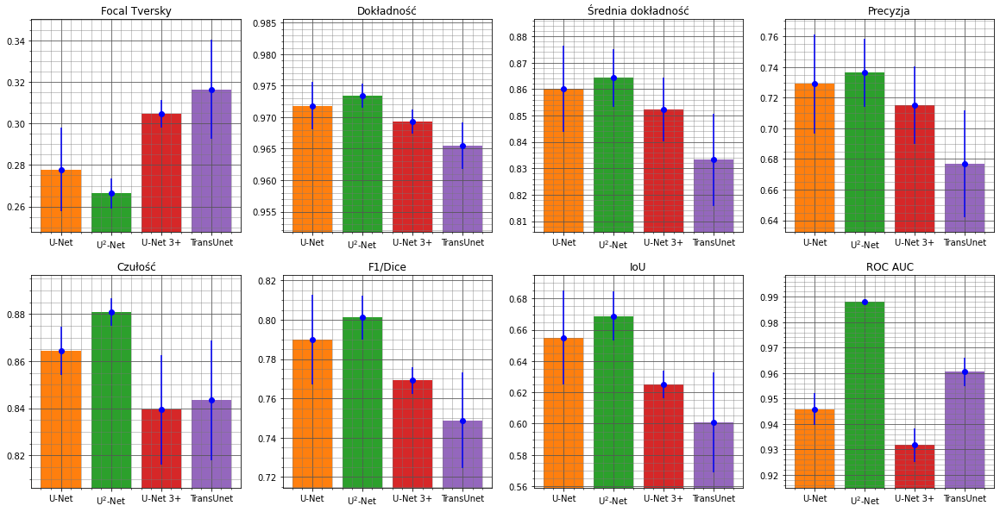

In [78]:
print_metrics_plot(s_on_s)

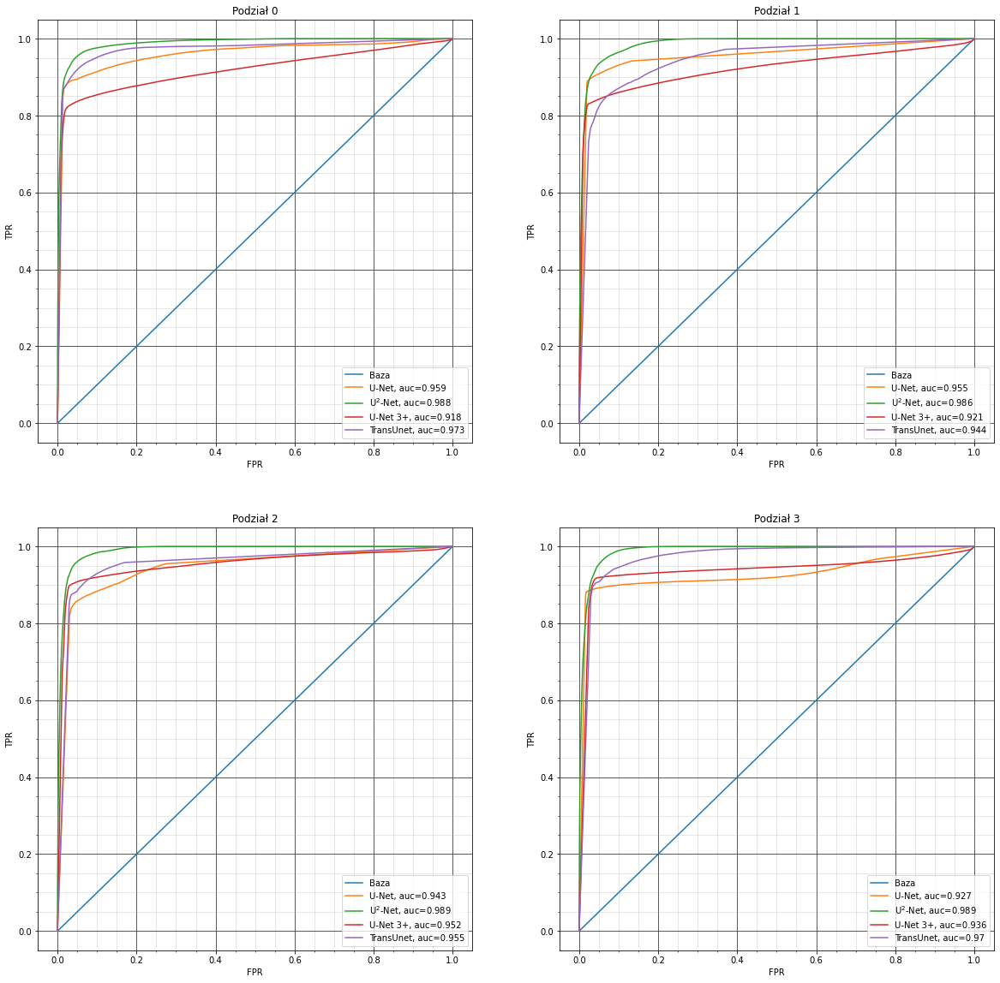

In [79]:
plot_rocs(s_on_s, samsung_masks)

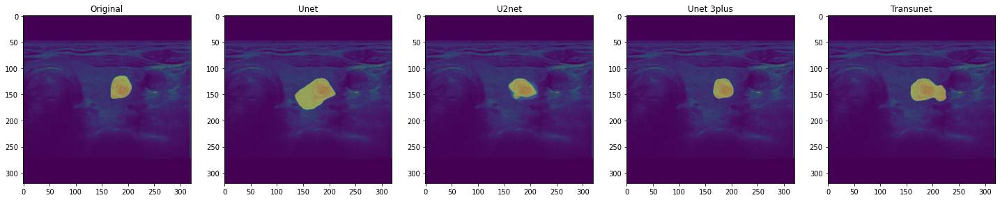

In [54]:
output = {}

model_paths = ['unet_2d/samsung/320_nf4_fi0/', 'u2net_2d/samsung/320_nf4_fi0/', 'unet_3plus_2d/samsung/320_nf4_fi0/', 'transunet_2d/samsung/320_nf4_fi0/']
plot_comparison(model_paths, samsung_images, samsung_masks, output, n=10)

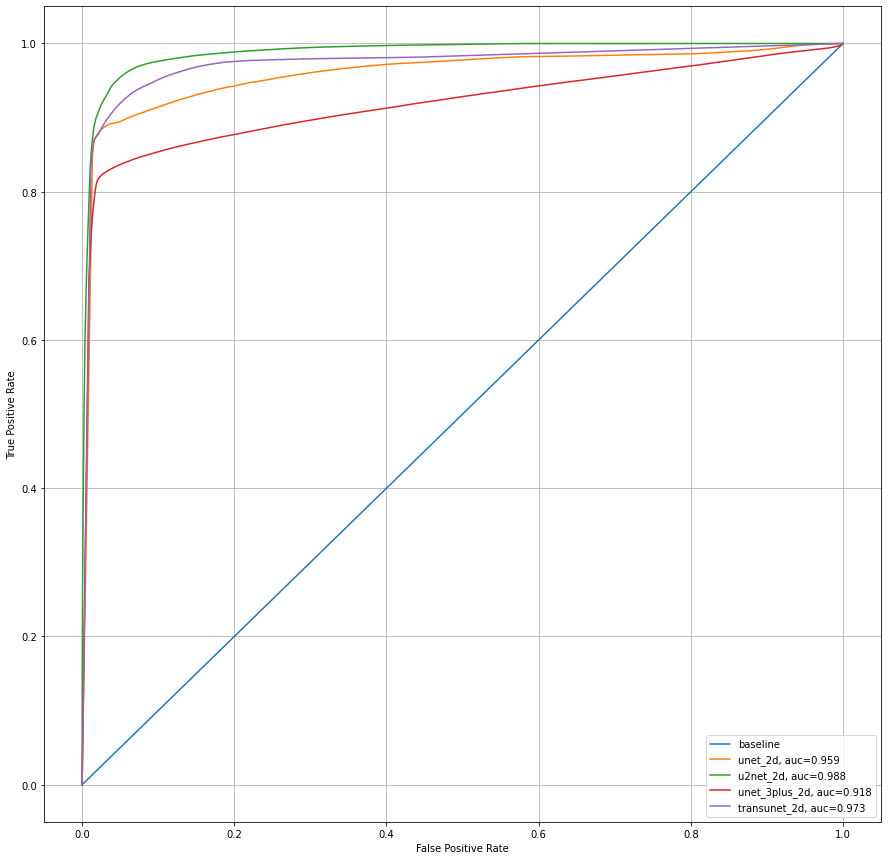

In [55]:
plot_roc(output, samsung_masks)

## 5.2. GE on GE

In [19]:
ge_models = {
    'U-Net': ['unet_2d/ge/320_nf4_fi0/', 'unet_2d/ge/320_nf4_fi1/', 'unet_2d/ge/320_nf4_fi2/', 'unet_2d/ge/320_nf4_fi3/'],
    r'U$^2$-Net': ['u2net_2d/ge/320_nf4_fi0/', 'u2net_2d/ge/320_nf4_fi1/', 'u2net_2d/ge/320_nf4_fi2/', 'u2net_2d/ge/320_nf4_fi3/'],
    'U-Net 3+': ['unet_3plus_2d/ge/320_nf4_fi0/', 'unet_3plus_2d/ge/320_nf4_fi1/', 'unet_3plus_2d/ge/320_nf4_fi2/', 'unet_3plus_2d/ge/320_nf4_fi3/'],
    'TransUnet': ['transunet_2d/ge/320_nf4_fi0/', 'transunet_2d/ge/320_nf4_fi1/', 'transunet_2d/ge/320_nf4_fi2/', 'transunet_2d/ge/320_nf4_fi3/']
}

In [ ]:
g_on_g = generate_metrics_matrix(ge_models, ge_images, ge_masks)

In [81]:
generate_model_metrics_tab(g_on_g)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.366 +- 1.40e-02  0.38 +- 7.26e-03   0.359 +- 3.30e-03  0.344 +- 1.22e-02
Dokładność          0.945 +- 3.13e-03  0.947 +- 4.21e-03  0.947 +- 2.08e-03  0.945 +- 6.15e-03
Średnia dokładność  0.8 +- 9.00e-03    0.812 +- 1.43e-02  0.809 +- 8.16e-03  0.805 +- 1.80e-02
Precyzja            0.616 +- 1.74e-02  0.644 +- 2.93e-02  0.634 +- 1.76e-02  0.625 +- 3.75e-02
Czułość             0.807 +- 1.42e-02  0.774 +- 1.09e-02  0.809 +- 1.56e-02  0.845 +- 2.48e-02
F1/Dice             0.699 +- 1.43e-02  0.7 +- 1.37e-02    0.709 +- 4.71e-03  0.713 +- 1.86e-02
IoU                 0.538 +- 1.68e-02  0.54 +- 1.62e-02   0.55 +- 5.69e-03   0.555 +- 2.20e-02
ROC AUC             0.895 +- 8.19e-03  0.961 +- 1.60e-03  0.907 +- 5.08e-03  0.938 +- 3.22e-03



| Metryki            | U-Net             | U$^2$-Net   

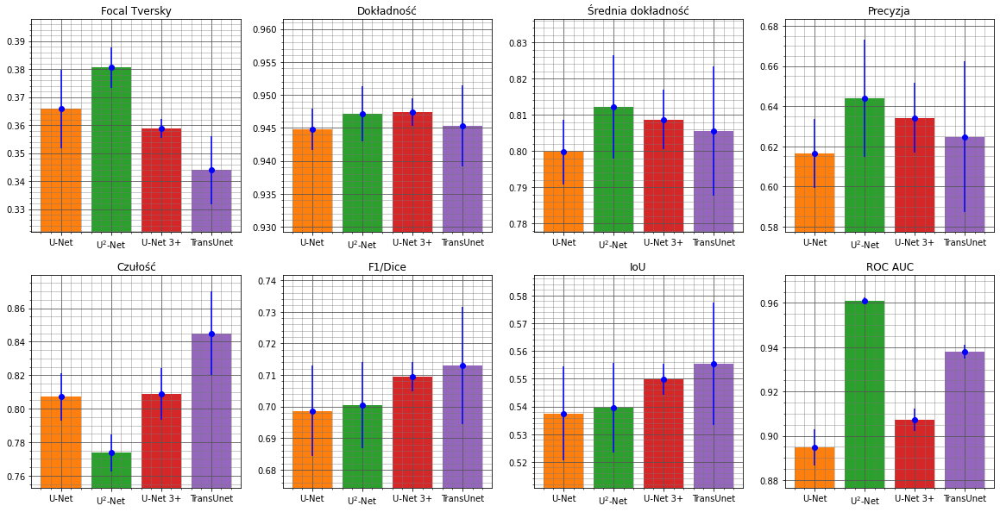

In [82]:
print_metrics_plot(g_on_g)

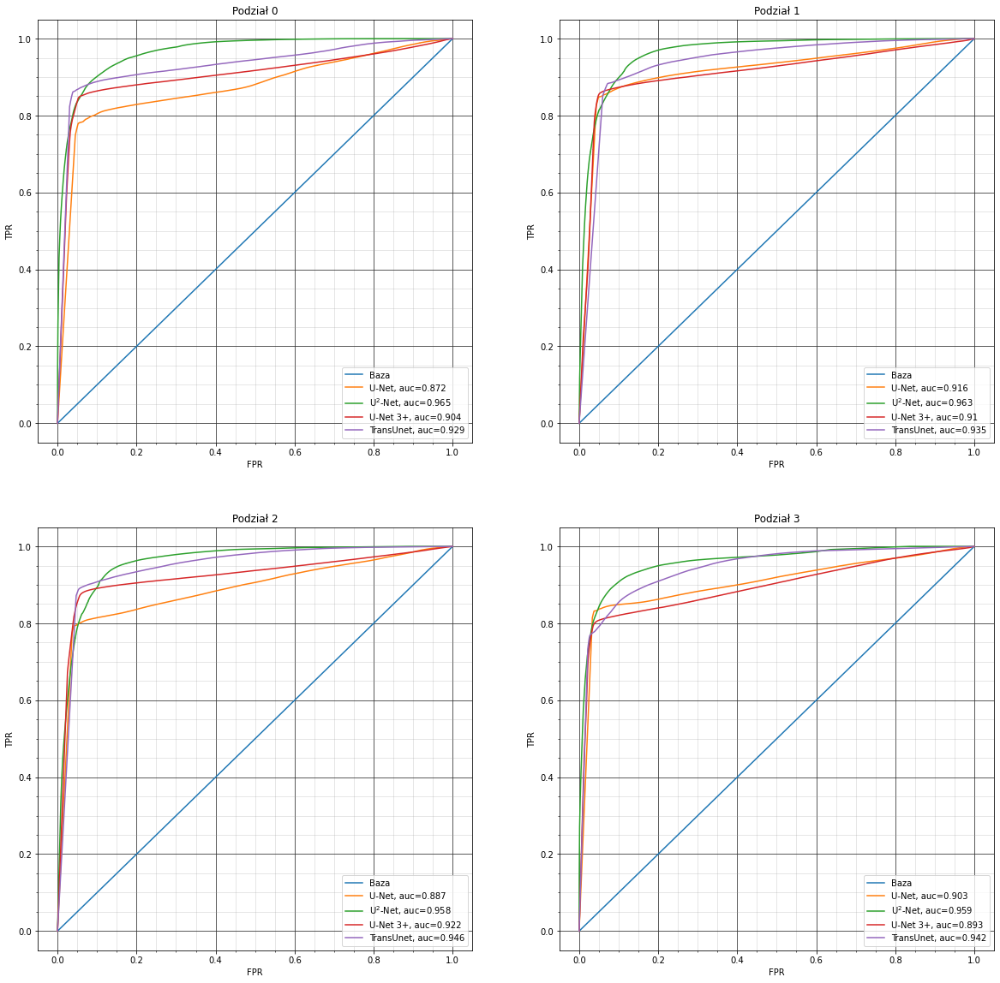

In [83]:
plot_rocs(g_on_g, ge_masks)

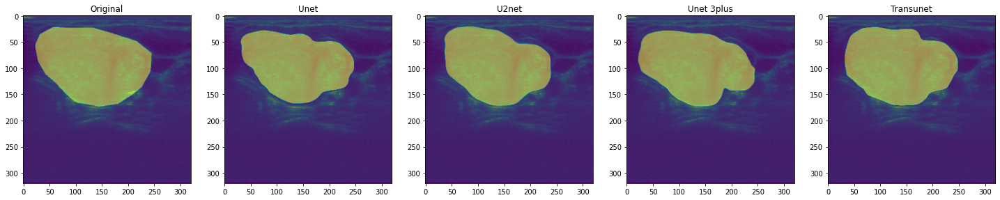

In [45]:
output = {}

model_paths = ['unet_2d/ge/320_nf4_fi0/', 'u2net_2d/ge/320_nf4_fi0/', 'unet_3plus_2d/ge/320_nf4_fi0/', 'transunet_2d/ge/320_nf4_fi1/']
plot_comparison(model_paths, ge_images, ge_masks, output, n=10)

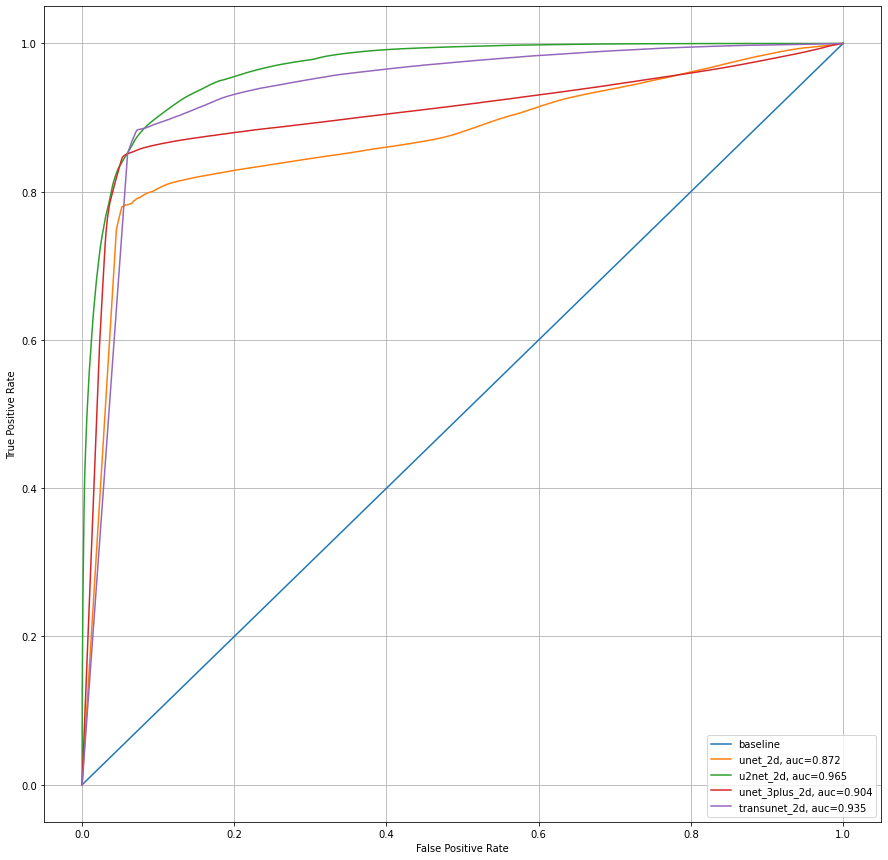

In [46]:
plot_roc(output, ge_masks)

## 5.3. Samsung on GE

In [84]:
s_on_g = generate_metrics_matrix(samsung_models, ge_images, ge_masks)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:

In [85]:
generate_model_metrics_tab(s_on_g)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.572 +- 3.35e-02  0.67 +- 1.99e-02   0.641 +- 6.64e-02  0.615 +- 2.55e-02
Dokładność          0.802 +- 3.52e-02  0.646 +- 3.93e-02  0.663 +- 7.46e-02  0.734 +- 3.98e-02
Średnia dokładność  0.638 +- 2.12e-02  0.587 +- 7.22e-03  0.61 +- 3.72e-02   0.609 +- 1.09e-02
Precyzja            0.291 +- 4.34e-02  0.181 +- 1.49e-02  0.234 +- 7.45e-02  0.229 +- 2.26e-02
Czułość             0.847 +- 2.27e-02  0.94 +- 8.59e-03   0.894 +- 2.72e-02  0.912 +- 1.28e-02
F1/Dice             0.424 +- 4.34e-02  0.303 +- 2.07e-02  0.346 +- 7.94e-02  0.363 +- 2.86e-02
IoU                 0.273 +- 3.57e-02  0.179 +- 1.43e-02  0.222 +- 6.59e-02  0.223 +- 2.10e-02
ROC AUC             0.835 +- 1.56e-02  0.908 +- 4.07e-03  0.839 +- 2.54e-02  0.825 +- 1.57e-02



| Metryki            | U-Net             | U$^2$-Net   

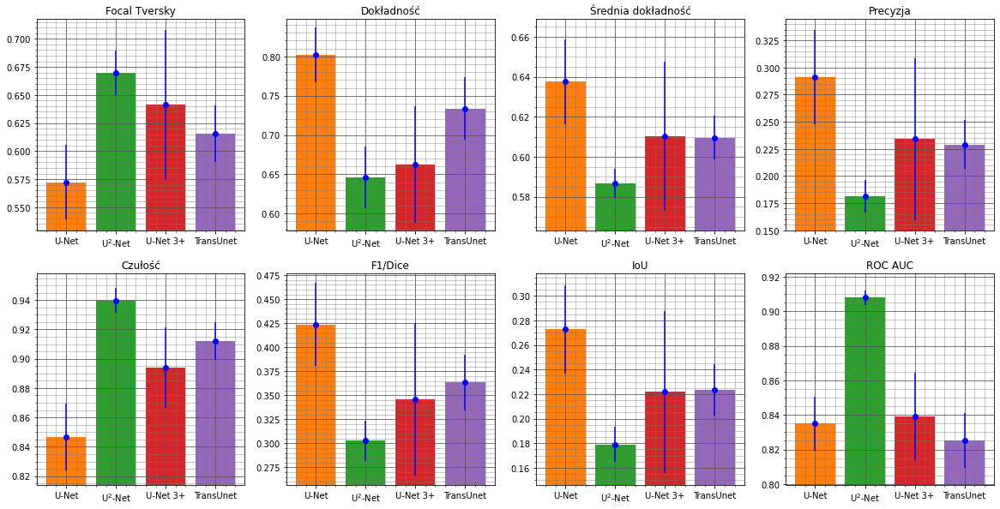

In [86]:
print_metrics_plot(s_on_g)

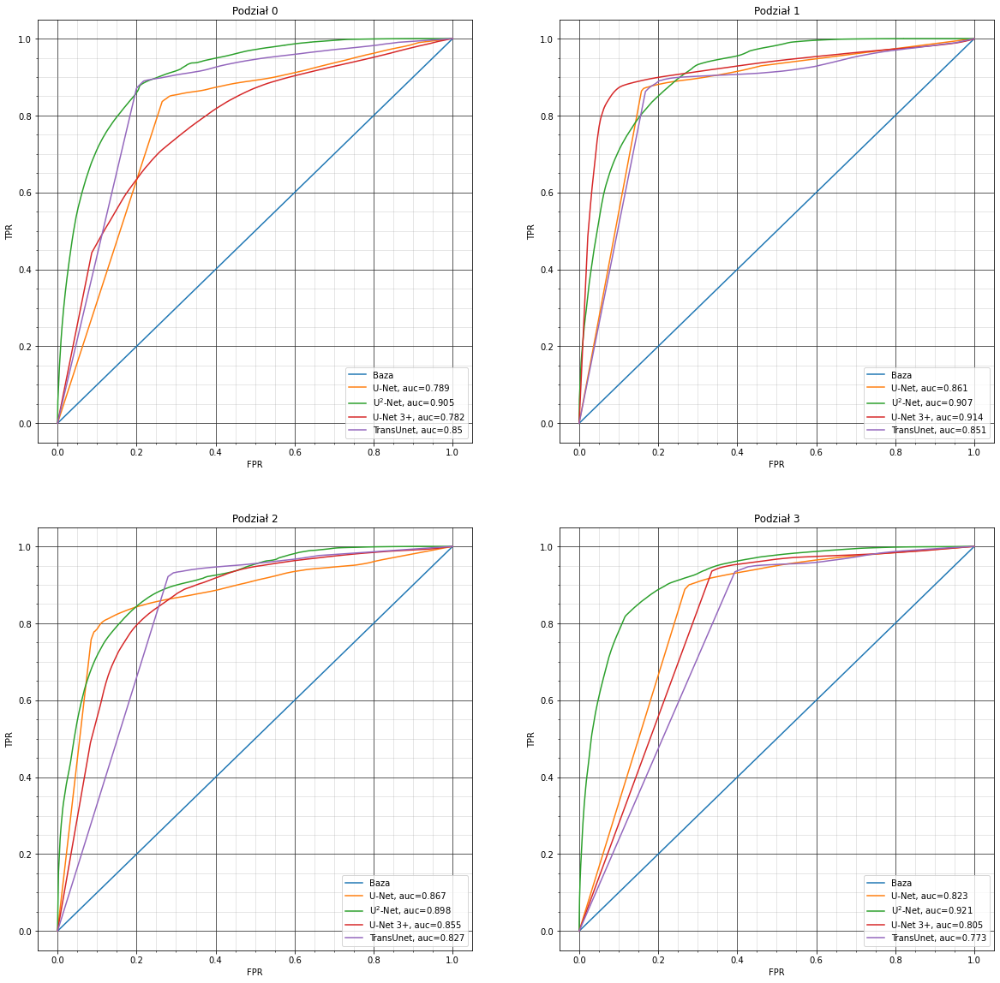

In [87]:
plot_rocs(s_on_g, ge_masks)

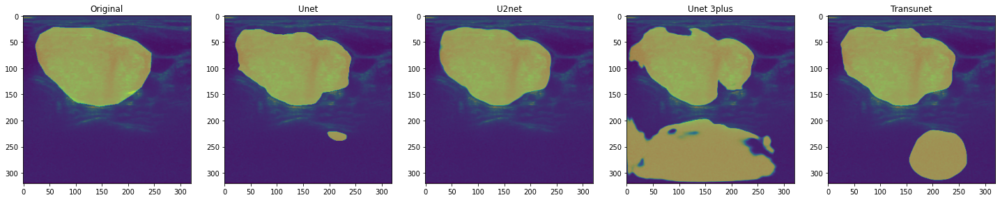

In [49]:
output = {}

model_paths = ['unet_2d/samsung/320_nf4_fi0/', 'u2net_2d/samsung/320_nf4_fi0/', 'unet_3plus_2d/samsung/320_nf4_fi0/', 'transunet_2d/samsung/320_nf4_fi0/']
plot_comparison(model_paths, ge_images, ge_masks, output, n=10)

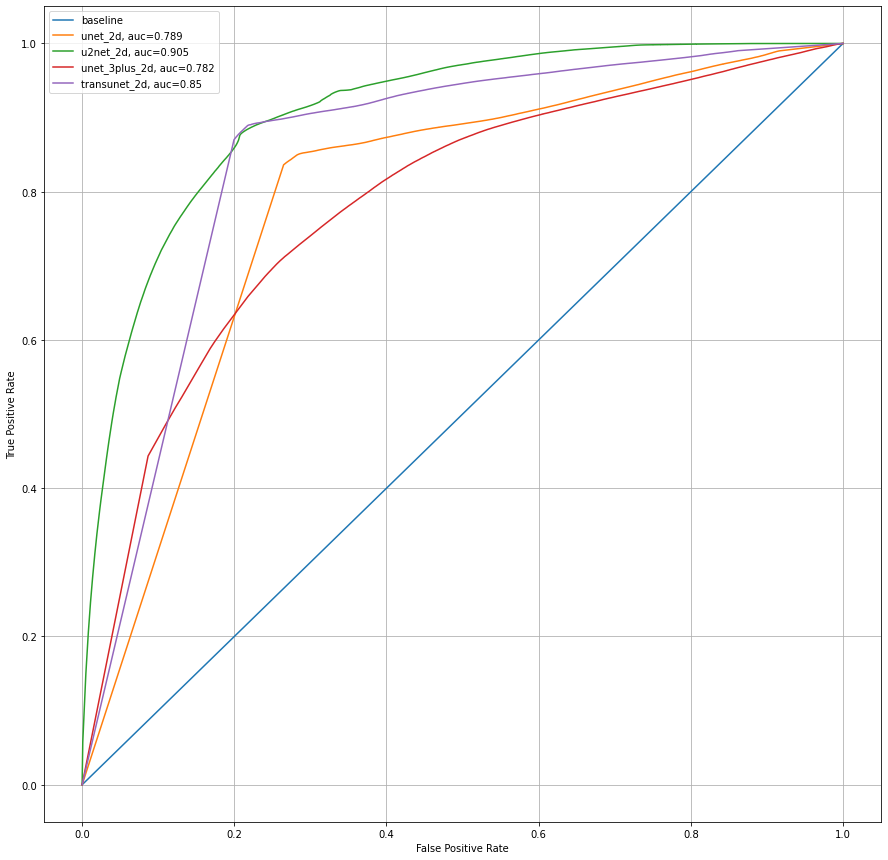

In [50]:
plot_roc(output, ge_masks)

## 5.4. GE on Samsung

In [88]:
g_on_s = generate_metrics_matrix(ge_models, samsung_images, samsung_masks)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:

In [89]:
generate_model_metrics_tab(g_on_s)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.391 +- 2.27e-02  0.434 +- 1.91e-02  0.398 +- 2.74e-02  0.381 +- 1.48e-02
Dokładność          0.965 +- 3.02e-03  0.96 +- 3.40e-03   0.967 +- 1.26e-03  0.962 +- 3.99e-03
Średnia dokładność  0.848 +- 1.47e-02  0.827 +- 1.81e-02  0.867 +- 1.28e-02  0.832 +- 2.12e-02
Precyzja            0.715 +- 2.89e-02  0.675 +- 3.58e-02  0.754 +- 2.75e-02  0.679 +- 4.39e-02
Czułość             0.715 +- 2.41e-02  0.677 +- 2.02e-02  0.694 +- 4.43e-02  0.754 +- 2.96e-02
F1/Dice             0.713 +- 2.22e-02  0.674 +- 2.22e-02  0.717 +- 1.49e-02  0.708 +- 1.72e-02
IoU                 0.556 +- 2.72e-02  0.51 +- 2.62e-02   0.559 +- 1.85e-02  0.548 +- 2.03e-02
ROC AUC             0.899 +- 1.81e-02  0.959 +- 7.84e-03  0.866 +- 2.16e-02  0.945 +- 4.32e-03



| Metryki            | U-Net             | U$^2$-Net   

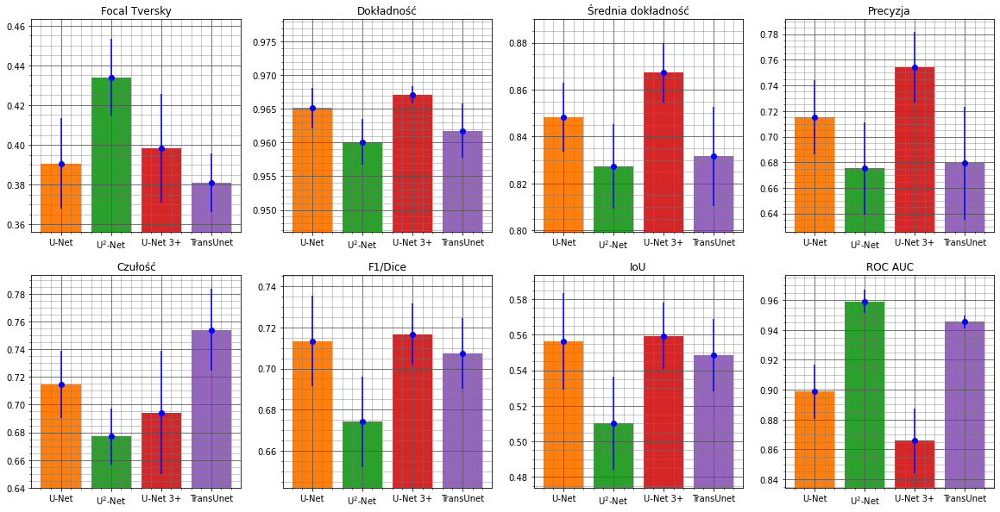

In [90]:
print_metrics_plot(g_on_s)

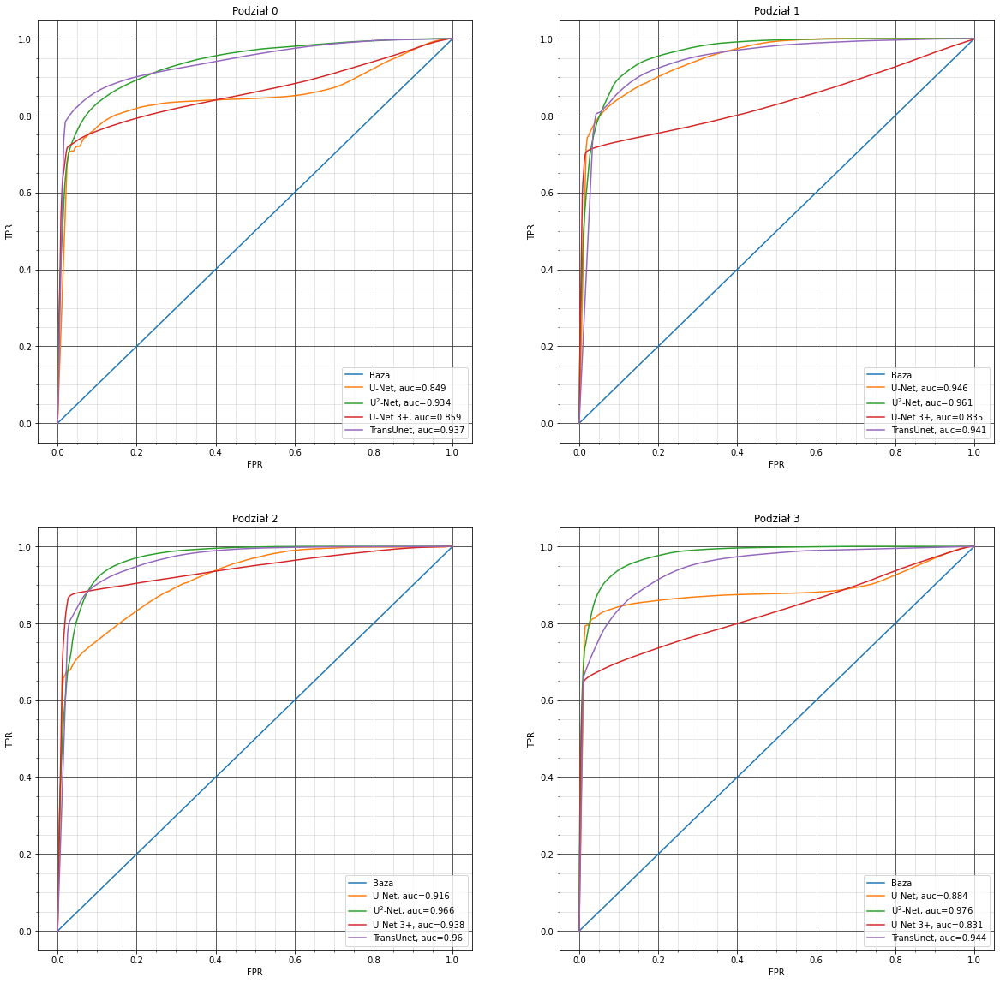

In [91]:
plot_rocs(g_on_s, samsung_masks)

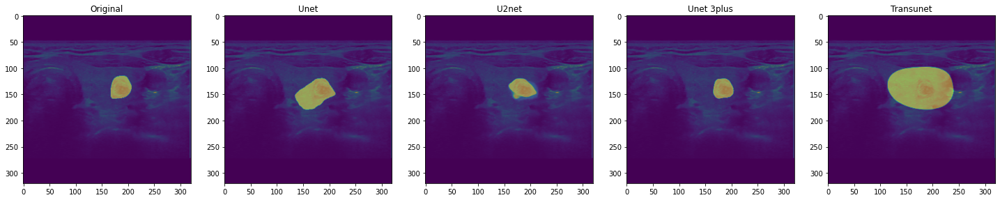

In [52]:
output = {}

model_paths = ['unet_2d/samsung/320_nf4_fi0/', 'u2net_2d/samsung/320_nf4_fi0/', 'unet_3plus_2d/samsung/320_nf4_fi0/', 'transunet_2d/samsung/320_nf4_fi1/']
plot_comparison(model_paths, samsung_images, samsung_masks, output, n=10)

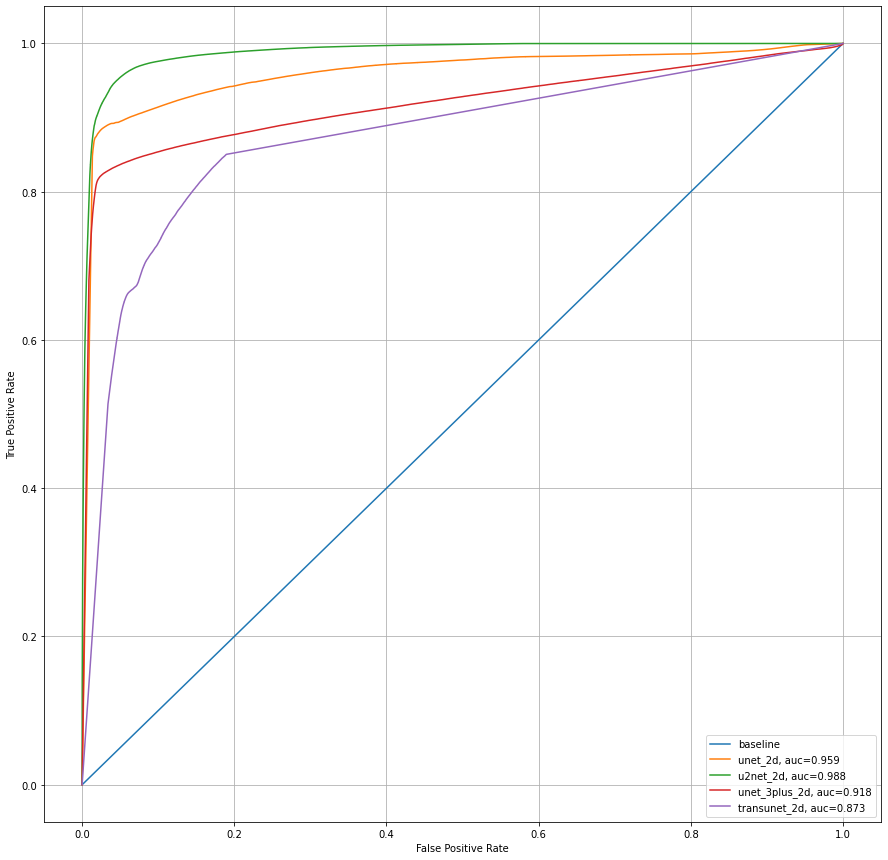

In [53]:
plot_roc(output, samsung_masks)

## 5.5. Mix on Samsung

In [20]:
mix_models = {
    'U-Net': ['unet_2d/mix/320_nf4_fi0/', 'unet_2d/mix/320_nf4_fi1/', 'unet_2d/mix/320_nf4_fi2/', 'unet_2d/mix/320_nf4_fi3/'],
    r'U$^2$-Net': ['u2net_2d/mix/320_nf4_fi0/', 'u2net_2d/mix/320_nf4_fi1/', 'u2net_2d/mix/320_nf4_fi2/', 'u2net_2d/mix/320_nf4_fi3/'],
    'U-Net 3+': ['unet_3plus_2d/mix/320_nf4_fi0/', 'unet_3plus_2d/mix/320_nf4_fi1/', 'unet_3plus_2d/mix/320_nf4_fi2/', 'unet_3plus_2d/mix/320_nf4_fi3/'],
    'TransUnet': ['transunet_2d/mix/320_nf4_fi0/', 'transunet_2d/mix/320_nf4_fi1/', 'transunet_2d/mix/320_nf4_fi2/', 'transunet_2d/mix/320_nf4_fi3/']
}

In [93]:
m_on_s = generate_metrics_matrix(mix_models, samsung_images, samsung_masks)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:

In [94]:
generate_model_metrics_tab(m_on_s)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.316 +- 2.75e-02  0.256 +- 1.41e-02  0.278 +- 6.06e-03  0.254 +- 8.75e-03
Dokładność          0.959 +- 7.47e-03  0.976 +- 1.10e-03  0.97 +- 1.27e-03   0.975 +- 1.43e-03
Średnia dokładność  0.812 +- 2.71e-02  0.879 +- 5.15e-03  0.849 +- 7.37e-03  0.868 +- 7.17e-03
Precyzja            0.633 +- 5.42e-02  0.767 +- 1.05e-02  0.707 +- 1.54e-02  0.744 +- 1.43e-02
Czułość             0.882 +- 1.01e-02  0.875 +- 1.83e-02  0.88 +- 1.38e-02   0.888 +- 7.89e-03
F1/Dice             0.731 +- 3.63e-02  0.817 +- 9.07e-03  0.783 +- 5.91e-03  0.809 +- 9.08e-03
IoU                 0.581 +- 4.47e-02  0.691 +- 1.31e-02  0.644 +- 7.90e-03  0.68 +- 1.30e-02
ROC AUC             0.932 +- 4.91e-03  0.989 +- 1.19e-03  0.942 +- 1.24e-02  0.97 +- 2.75e-03



| Metryki            | U-Net             | U$^2$-Net     

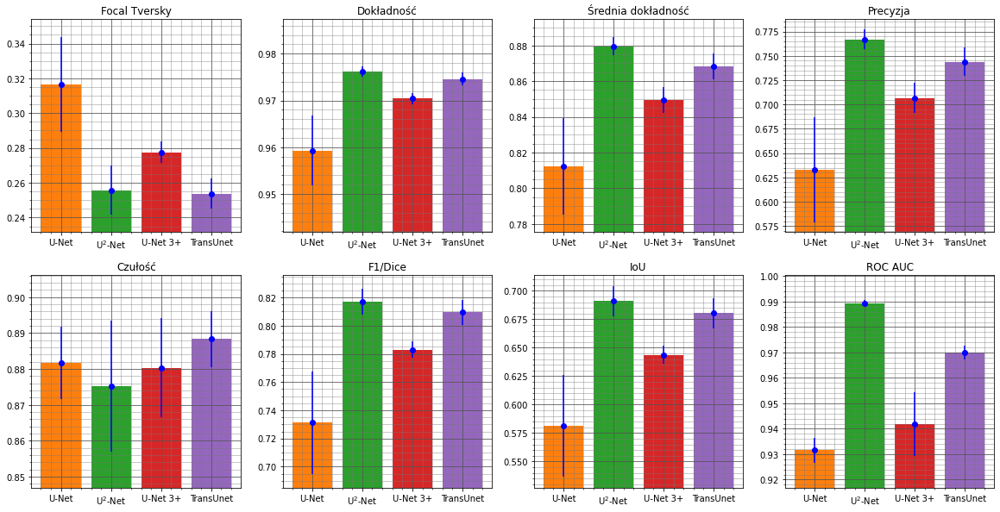

In [95]:
print_metrics_plot(m_on_s)

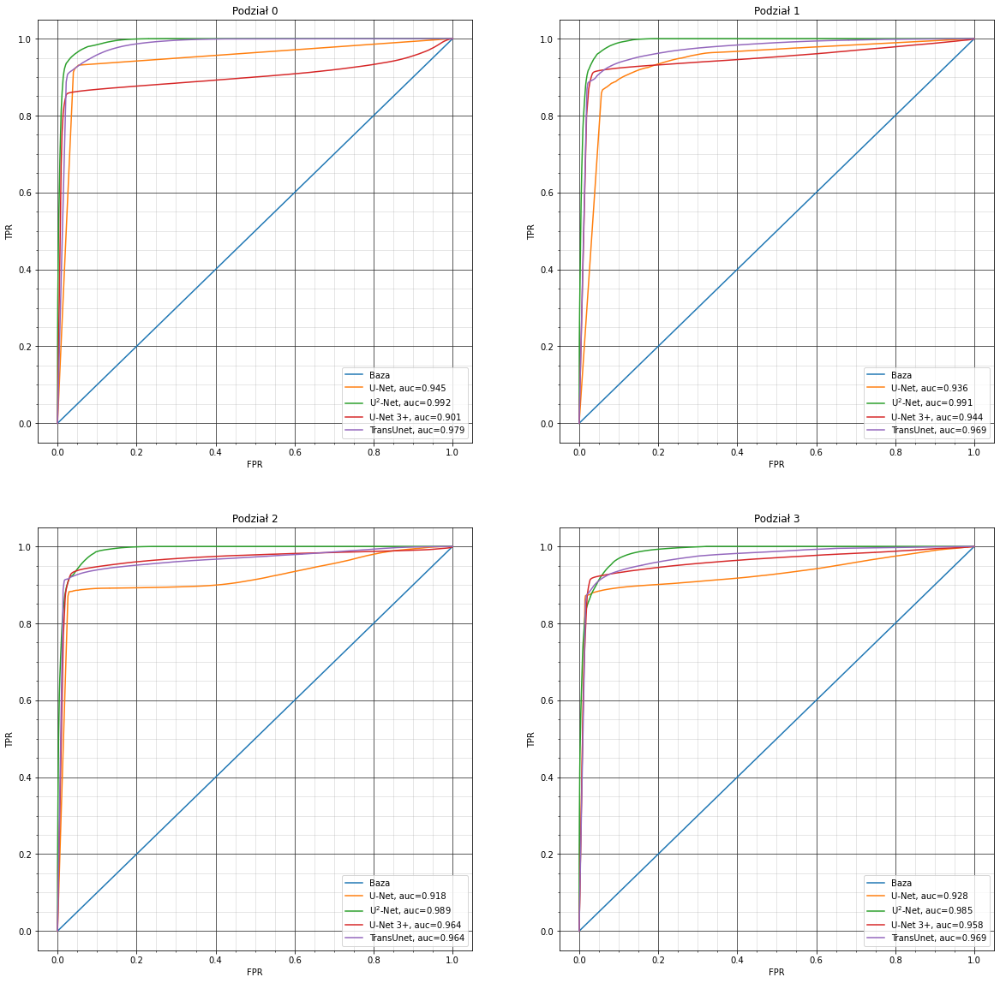

In [96]:
plot_rocs(m_on_s, samsung_masks)

## 5.5. Mix on GE

In [97]:
m_on_g = generate_metrics_matrix(mix_models, ge_images, ge_masks)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
loading model:  unet_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
loading model:  u2net_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2')
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
loading model:  unet_3plus_2d
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:

In [98]:
generate_model_metrics_tab(m_on_g)

Metryki             U-Net              U$^2$-Net          U-Net 3+           TransUnet
------------------  -----------------  -----------------  -----------------  -----------------
Focal Tversky       0.386 +- 3.43e-02  0.333 +- 7.39e-03  0.364 +- 9.64e-03  0.322 +- 4.21e-03
Dokładność          0.934 +- 9.97e-03  0.956 +- 2.28e-03  0.947 +- 2.25e-03  0.956 +- 1.94e-03
Średnia dokładność  0.776 +- 2.42e-02  0.837 +- 8.81e-03  0.807 +- 9.20e-03  0.833 +- 7.65e-03
Precyzja            0.568 +- 4.68e-02  0.691 +- 1.84e-02  0.631 +- 1.99e-02  0.681 +- 1.60e-02
Czułość             0.814 +- 3.28e-02  0.812 +- 1.48e-02  0.803 +- 2.36e-02  0.831 +- 1.04e-02
F1/Dice             0.666 +- 3.85e-02  0.745 +- 8.41e-03  0.705 +- 6.68e-03  0.748 +- 6.65e-03
IoU                 0.504 +- 4.15e-02  0.594 +- 1.07e-02  0.544 +- 7.92e-03  0.598 +- 8.43e-03
ROC AUC             0.895 +- 1.35e-02  0.969 +- 1.61e-03  0.897 +- 1.90e-02  0.933 +- 6.79e-03



| Metryki            | U-Net             | U$^2$-Net   

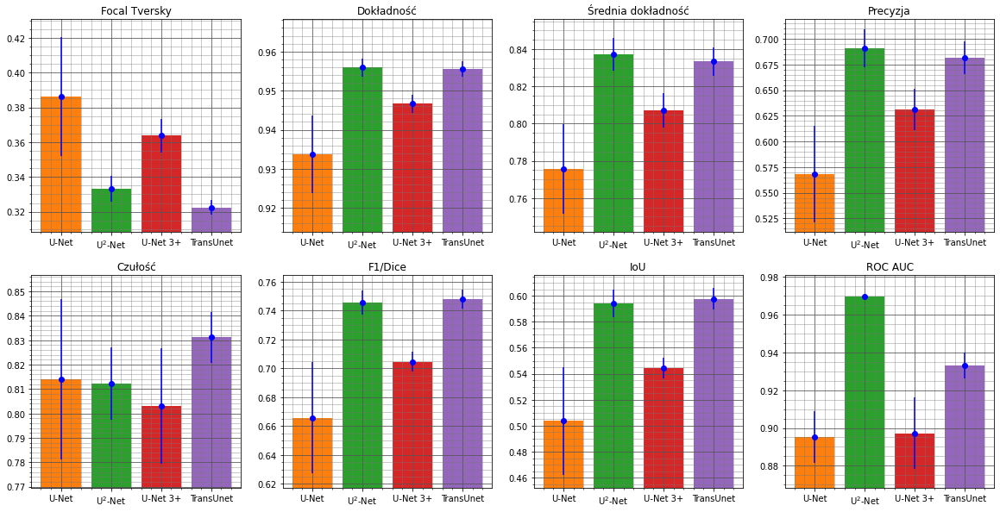

In [99]:
print_metrics_plot(m_on_g)

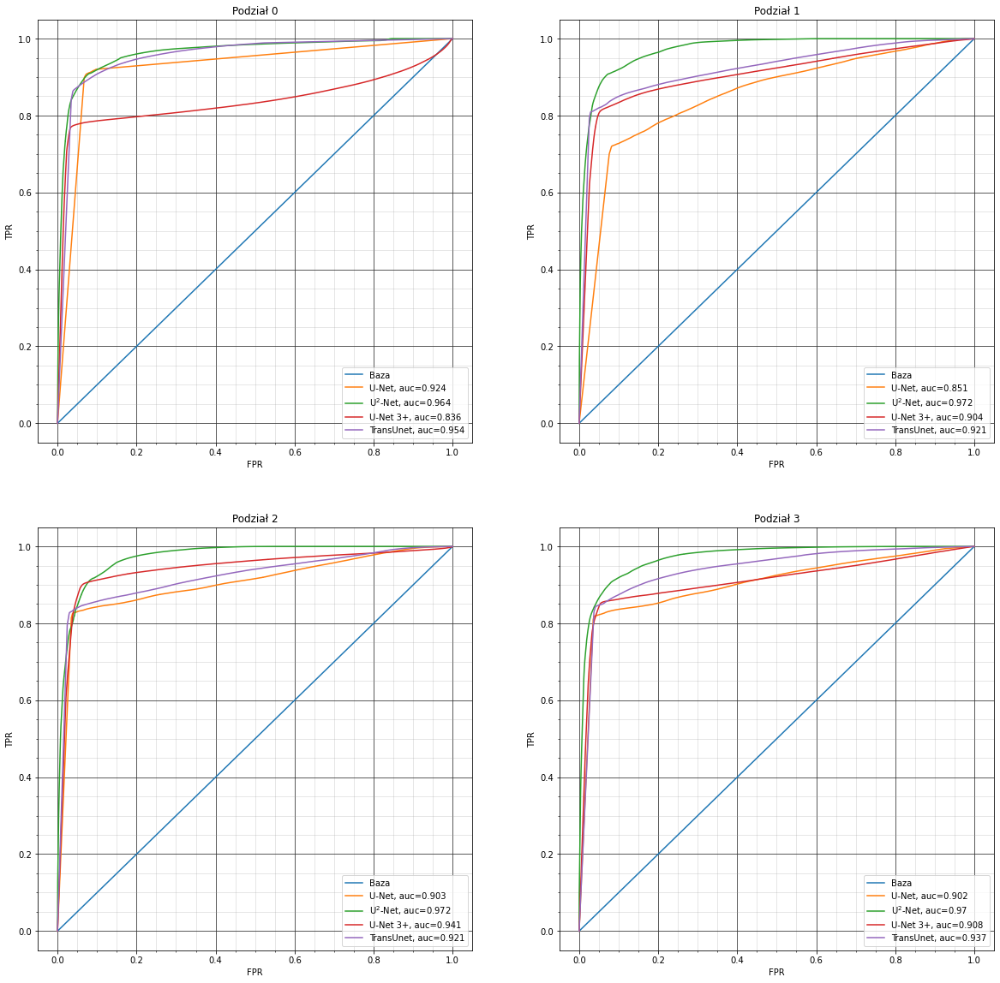

In [100]:
plot_rocs(m_on_g, ge_masks)

## 6. Generate images

In [10]:
def plot_comparison(model_paths, image, mask, n=0):
    
    plt.figure(figsize=(25, 25))
    plt.subplot(1, 5, 1)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5, cmap=original_map)
    plt.title('Oryginał', fontsize=18)
    
    i=2
    for title, m_paths in model_paths.items():
        m_path = m_paths[0]
        gpus = tf.config.list_logical_devices('GPU')
        strategy = tf.distribute.MirroredStrategy(gpus)

        with strategy.scope():
            print('loading model: ', title)
            model = tf.keras.models.load_model(f'output/{m_path}model/model', custom_objects=custom_objects)
            prediction = model.predict(np.expand_dims(image, 0))[0]

        plt.subplot(1, 5, i)
        plt.imshow(image)
        plt.imshow(prediction, alpha=0.5, cmap=original_map)
        plt.title(title, fontsize=18)
        i += 1
    clear_output(wait=False)
    plt.show()

## 6.1. Samsung images

In [27]:
def sorted_preditions(model_path, images, masks):
    
    model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)
    
    for idx in range(8):
        start_index = idx*8
        end_index = start_index + 8
        sub_pred = model.predict(images[start_index:end_index])
        if idx == 0:
            predictions = sub_pred
        else:
            predictions = np.concatenate((predictions, sub_pred), axis=0)

    
    results = {}
    i = 0
    for mask, prediction in zip(masks, predictions):                
        # fpr, tpr, threshold = metrics.roc_curve(np.round(mask).astype(int).flatten(), prediction.flatten())
        # roc_auc = metrics.auc(fpr, tpr)
        
        loss_val = custom_focal_tversky(mask, prediction)
        
        results[i] = float(loss_val)
        i += 1
        
    # sort
    
    return dict(sorted(results.items(), key=lambda item: item[1]))

In [28]:
sorted_preditions(f'output/unet_2d/samsung/320_nf4_fi0/model/model', samsung_images, samsung_masks)

{40: 0.05651799961924553,
 59: 0.07564400881528854,
 14: 0.07830020040273666,
 11: 0.07949227094650269,
 51: 0.0928262397646904,
 2: 0.09361673146486282,
 20: 0.09396325796842575,
 16: 0.09406265616416931,
 50: 0.09714610129594803,
 3: 0.10998184233903885,
 56: 0.11734680086374283,
 38: 0.11768367141485214,
 63: 0.1251789629459381,
 0: 0.12565763294696808,
 6: 0.12985512614250183,
 12: 0.13515415787696838,
 21: 0.13814304769039154,
 25: 0.14334194362163544,
 55: 0.15354828536510468,
 32: 0.15890488028526306,
 19: 0.16188685595989227,
 9: 0.16928064823150635,
 34: 0.17097100615501404,
 62: 0.1743791550397873,
 13: 0.17584490776062012,
 31: 0.1770535260438919,
 44: 0.1790492832660675,
 39: 0.18677635490894318,
 29: 0.1913776397705078,
 46: 0.20272396504878998,
 49: 0.206844761967659,
 43: 0.2078780084848404,
 53: 0.2163737416267395,
 15: 0.23376113176345825,
 60: 0.2418477088212967,
 28: 0.25624966621398926,
 8: 0.26110967993736267,
 1: 0.2616005539894104,
 27: 0.27913257479667664,
 33: 

In [12]:
sorted_preditions(f'output/unet_2d/samsung/320_nf4_fi0/model/model', samsung_images, samsung_masks)

{37: 0.5603569810329514,
 18: 0.5670365185896047,
 42: 0.639348415803529,
 26: 0.8366897013027662,
 52: 0.8689431127108734,
 41: 0.8781182541738433,
 23: 0.8822812539042184,
 61: 0.8879056190338551,
 30: 0.8991537078252916,
 58: 0.8991578452444058,
 4: 0.9103467845952014,
 54: 0.920763075788664,
 10: 0.9246688254651696,
 57: 0.9389978640812894,
 5: 0.9392984941741078,
 1: 0.9422850961773683,
 45: 0.9423884154181841,
 28: 0.946238233406118,
 53: 0.9502634662842588,
 17: 0.9514425079434603,
 29: 0.9526538661773557,
 22: 0.9553223849866932,
 44: 0.9563023443844505,
 36: 0.9623787333513664,
 33: 0.9626719507970646,
 43: 0.963122917722352,
 27: 0.9669283171582154,
 7: 0.9696587123412809,
 48: 0.9719765783059942,
 24: 0.9739327918564982,
 25: 0.9761838652492106,
 49: 0.9764453695361022,
 35: 0.9792767870374944,
 60: 0.9799680623979148,
 39: 0.9808450093274064,
 47: 0.9817983585208516,
 38: 0.9822529176453385,
 19: 0.9828849606036607,
 9: 0.9835677270244625,
 51: 0.9847675796395079,
 2: 0.985

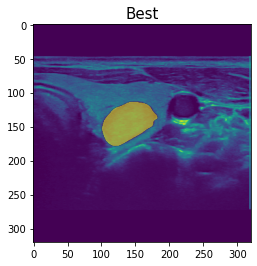

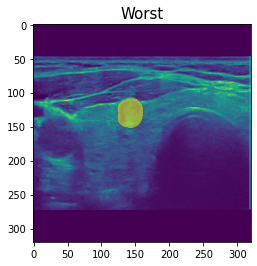

In [44]:
# Example of great classsication

i = 40
# i = 56
best_samsung_image = samsung_images[i]
best_samsung_mask = samsung_masks[i]

plt.imshow(best_samsung_image)
plt.imshow(best_samsung_mask, alpha=0.5, cmap=original_map)
plt.title('Best', fontsize=15)
plt.show()

# Example of bad classsication
i = 36
worst_samsung_image = samsung_images[i]
worst_samsung_mask = samsung_masks[i]

plt.imshow(worst_samsung_image)
plt.imshow(worst_samsung_mask, alpha=0.5, cmap=original_map)
plt.title('Worst', fontsize=15)
plt.show()

### 6.1.1 Samsung models

**Best**

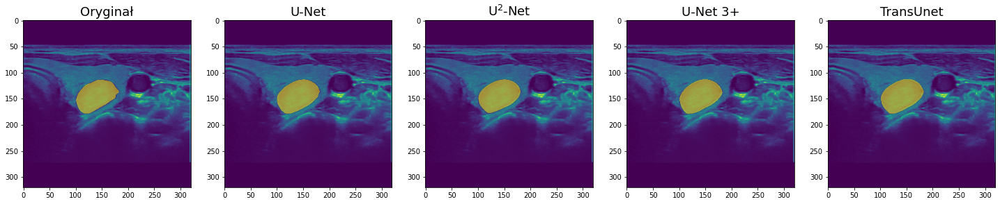

In [45]:
plot_comparison(samsung_models, best_samsung_image, best_samsung_mask)

**Worst**

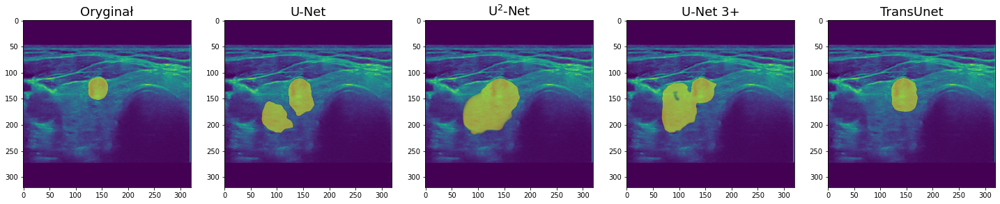

In [36]:
plot_comparison(samsung_models, worst_samsung_image, worst_samsung_mask)

### 6.1.2 GE models

**Best**

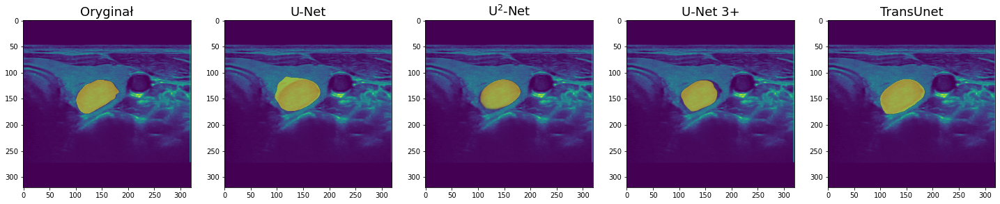

In [47]:
plot_comparison(ge_models, best_samsung_image, best_samsung_mask)

**Worst**

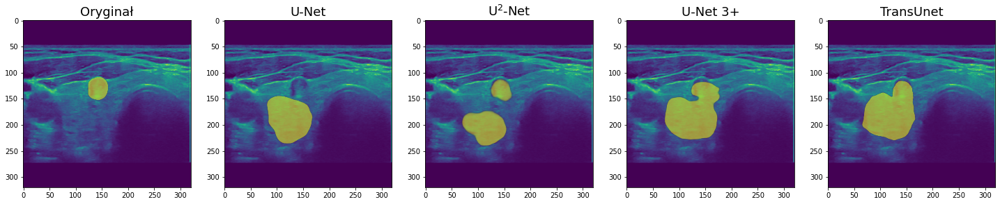

In [48]:
plot_comparison(ge_models, worst_samsung_image, worst_samsung_mask)

### 6.1.3. Mix models

**Best**

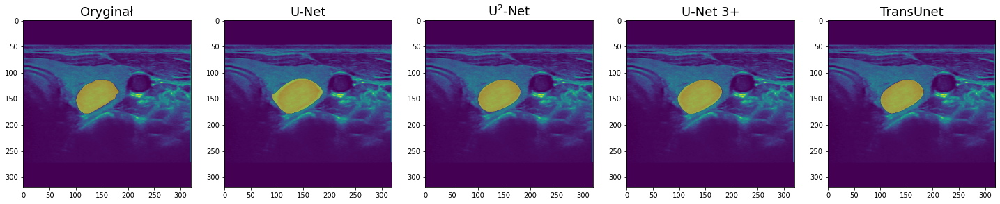

In [49]:
plot_comparison(mix_models, best_samsung_image, best_samsung_mask)

**Worst**

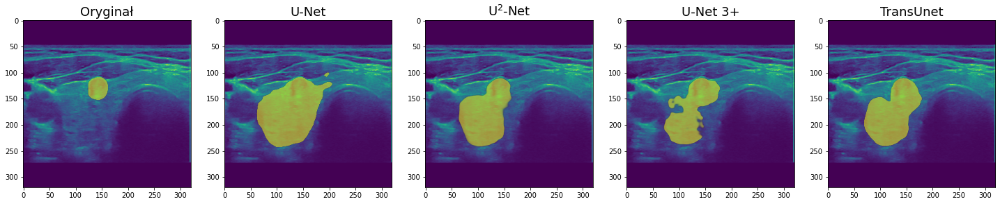

In [50]:
plot_comparison(mix_models, worst_samsung_image, worst_samsung_mask)

## 6.2. GE images

In [51]:
sorted_preditions(f'output/unet_2d/ge/320_nf4_fi0/model/model', ge_images, ge_masks)

{3: 0.13676995038986206,
 48: 0.1777196228504181,
 14: 0.18819835782051086,
 13: 0.19280008971691132,
 42: 0.1966375708580017,
 59: 0.19921357929706573,
 19: 0.20281778275966644,
 54: 0.21240046620368958,
 18: 0.22323110699653625,
 20: 0.22517606616020203,
 32: 0.23903793096542358,
 33: 0.2564735412597656,
 28: 0.25986236333847046,
 37: 0.26713821291923523,
 5: 0.27671948075294495,
 10: 0.2839130461215973,
 4: 0.2878805994987488,
 49: 0.29235899448394775,
 36: 0.29401320219039917,
 62: 0.29937827587127686,
 16: 0.30058079957962036,
 50: 0.33894893527030945,
 47: 0.34196770191192627,
 55: 0.3907183110713959,
 60: 0.4092894196510315,
 0: 0.42673760652542114,
 40: 0.4515014588832855,
 26: 0.4515891671180725,
 17: 0.4549015164375305,
 29: 0.4803597331047058,
 31: 0.4837532937526703,
 35: 0.4860038161277771,
 23: 0.4967321455478668,
 8: 0.5016116499900818,
 57: 0.5150437355041504,
 24: 0.5150967240333557,
 7: 0.5210011601448059,
 9: 0.5257576704025269,
 51: 0.5302814245223999,
 63: 0.535530

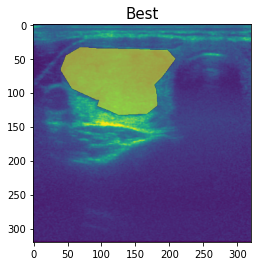

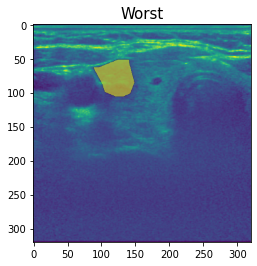

In [65]:
# Example of great classsication
i = 3
best_ge_image = ge_images[i]
best_ge_mask = ge_masks[i]

plt.imshow(best_ge_image)
plt.imshow(best_ge_mask, alpha=0.5, cmap=original_map)
plt.title('Best', fontsize=15)
plt.show()

# Example of bad classsication
i = 58
worst_ge_image = ge_images[i]
worst_ge_mask = ge_masks[i]

plt.imshow(worst_ge_image)
plt.imshow(worst_ge_mask, alpha=0.5, cmap=original_map)
plt.title('Worst', fontsize=15)
plt.show()

### 6.2.1. GE models

**Best**

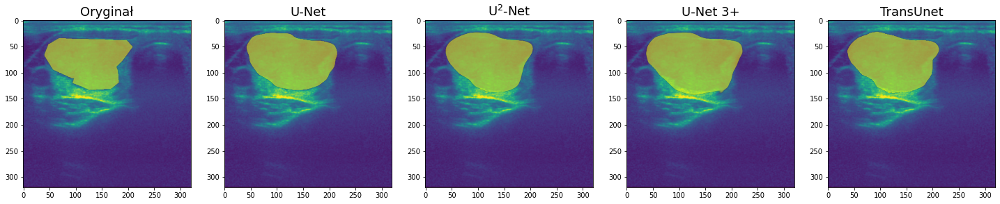

In [62]:
plot_comparison(ge_models, best_ge_image, best_ge_mask)

**Worst**

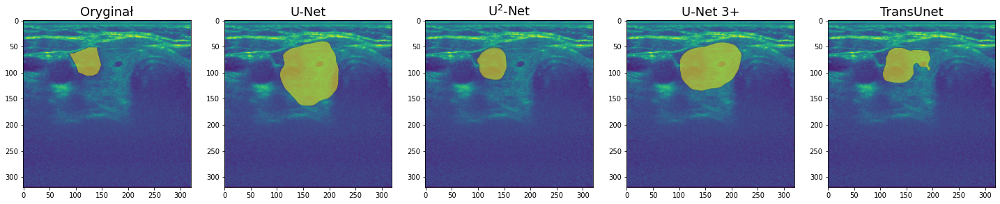

In [66]:
plot_comparison(ge_models, worst_ge_image, worst_ge_mask)

### 6.2.2. Samsung models

**Best**

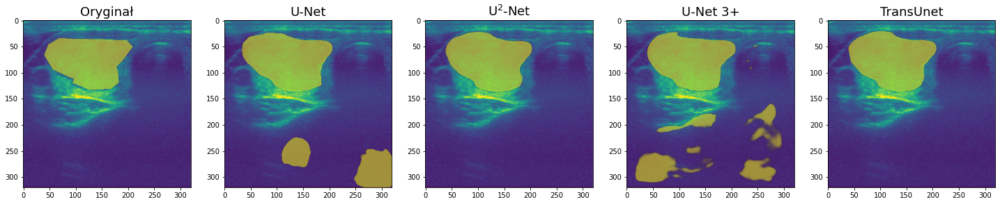

In [67]:
plot_comparison(samsung_models, best_ge_image, best_ge_mask)

**Worst**

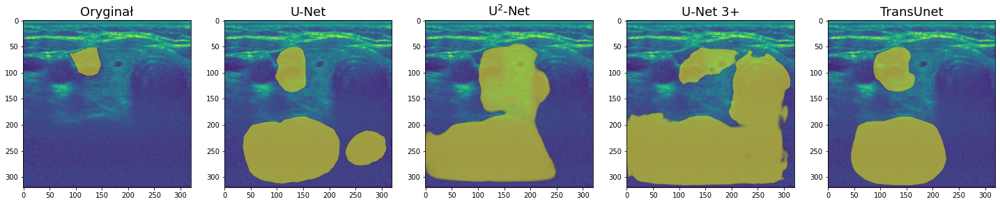

In [68]:
plot_comparison(samsung_models, worst_ge_image, worst_ge_mask)

### 6.1.3. Mix models

**Best**

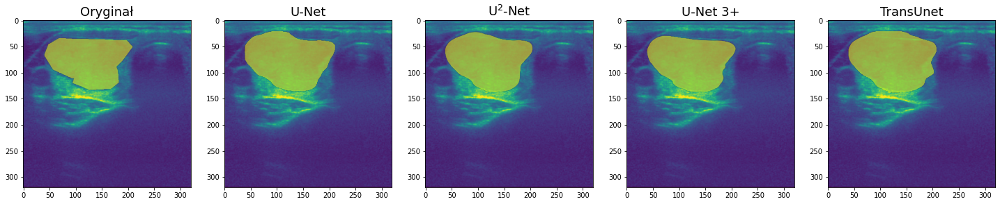

In [69]:
plot_comparison(mix_models, best_ge_image, best_ge_mask)

**Worst**

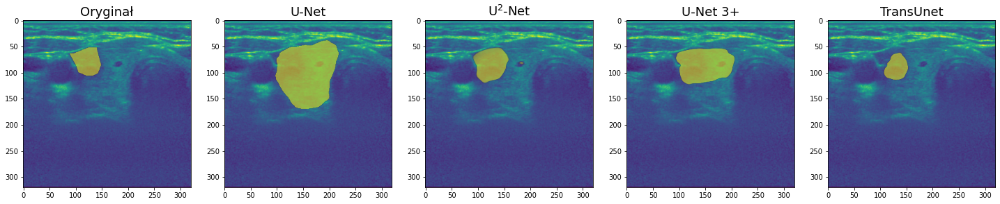

In [70]:
plot_comparison(mix_models, worst_ge_image, worst_ge_mask)